# Setting Filepaths

In [1]:
# Paths to docked pose folders (using Linux paths)

wd = "/home/manndo/master_dev"
autodock_poses_dir = wd + "/docking_ready_mgltools/docking"
diffdock_poses_dir = wd + "/diffdock_results"
equibind_poses_dir = wd + "/equibind_docked_poses"

# Optional: protein files for intermolecular distance checks
proteins_dir = wd + "/Orai"

# Setup Clustering Data 

In [1]:
"""
Binding Pocket Clustering Analysis — Shared Setup
===================================================
Collect all docked poses and extract ligand centroids.
Only includes poses that PASSED ALL PoseBusters tests.
Shared functions used by both K-Medoids and Ward clustering cells.
"""

import numpy as np
import pandas as pd
import math
from pathlib import Path
from collections import defaultdict
from itertools import combinations
import re
import warnings
warnings.filterwarnings('ignore')

try:
    from rdkit import Chem
    from rdkit.Chem import AllChem
    RDKIT_AVAILABLE = True
except ImportError:
    RDKIT_AVAILABLE = False
    print("ERROR: RDKit is required. Install with: conda install -c conda-forge rdkit")

try:
    from sklearn.cluster import AgglomerativeClustering
    from sklearn.metrics import silhouette_score, adjusted_rand_score, normalized_mutual_info_score
    from sklearn.preprocessing import StandardScaler
    from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
    from scipy.spatial.distance import pdist, squareform
    SKLEARN_AVAILABLE = True
except ImportError:
    SKLEARN_AVAILABLE = False
    print("ERROR: scikit-learn and scipy are required. Install with: conda install scikit-learn scipy")

try:
    from sklearn_extra.cluster import KMedoids
    KMEDOIDS_AVAILABLE = True
except ImportError:
    KMEDOIDS_AVAILABLE = False
    print("WARNING: sklearn_extra not found. Install with: pip install scikit-learn-extra")
    print("         Will use a simple K-Medoids fallback implementation.")

import matplotlib.pyplot as plt
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.patches as mpatches

# ============================================================================
# CONFIGURATION
# ============================================================================
wd = "/home/manndo/master_dev"
autodock_poses_dir = wd + "/docking_ready_mgltools/docking"
diffdock_poses_dir = wd + "/diffdock_results"
equibind_poses_dir = wd + "/equibind_docked_poses"
output_dir = Path(wd + "/posebusters_results")
converted_dir = output_dir / "converted_pdbqt"
output_dir.mkdir(exist_ok=True)

# PoseBusters-proved pose directories
posebuster_proved_dir = Path(wd) / "posebuster_proved"
proved_autodock_dir = posebuster_proved_dir / "autodock_vina"
proved_diffdock_dir = posebuster_proved_dir / "diffdock"
proved_equibind_dir = posebuster_proved_dir / "equibind"

K_RANGE = range(2, 11)
RANDOM_STATE = 42

# ============================================================================
# LOAD POSEBUSTERS-PROVED MANIFEST
# ============================================================================

manifest_path = posebuster_proved_dir / "posebuster_proved_manifest.csv"
pb_results_path = Path(wd) / "posebusters_results" / "posebusters_filtered_results.csv"

# Build a set of file paths that passed all PoseBusters tests
proved_files = set()

if manifest_path.exists():
    df_manifest = pd.read_csv(manifest_path)
    if "pose_file" in df_manifest.columns:
        proved_files = set(df_manifest["pose_file"].dropna().astype(str))
    elif df_manifest.columns[0]:
        # First column is likely the file path
        proved_files = set(df_manifest.iloc[:, 0].dropna().astype(str))
    print(f"Loaded {len(proved_files)} PoseBusters-proved file paths from manifest.")
elif pb_results_path.exists():
    # Fallback: recompute from the full results CSV
    df_pb = pd.read_csv(pb_results_path)
    
    # Identify boolean test columns (same logic as PoseBusters.ipynb)
    exclude_cols = {
        'mol_true_loaded', 'mol_cond_loaded',
        'number_short_outlier_bonds', 'number_long_outlier_bonds',
        'number_outlier_angles', 'number_clashes',
        'number_non-aromatic_rings_pass', 'number_aromatic_rings_pass',
        'number_non-aromatic_rings_checked', 'number_aromatic_rings_checked',
        'number_double_bonds_checked', 'number_double_bonds_pass',
        'number_valid_bonds', 'number_valid_angles', 'number_valid_noncov_pairs',
        'number_noncov_pairs', 'number_bonds', 'number_angles',
        'num_h_added',
    }
    metadata_cols = {
        'file_path', 'filepath', 'file', 'path', 'sdf_file', 'sdf_path',
        'method', 'docking_method', 'protein', 'ligand', 'pose_rank', 'rank',
        'molecule', 'mol_name', 'name', 'complex', 'protein_path', 'ligand_path',
        'mol_pred', 'mol_true', 'mol_cond',
    }
    
    test_cols = []
    for col in df_pb.columns:
        col_lower = col.lower().strip()
        if col_lower in metadata_cols or col in exclude_cols:
            continue
        if col_lower.startswith('number_') or col_lower.startswith('num_'):
            continue
        unique_vals = df_pb[col].dropna().unique()
        if set(unique_vals).issubset({True, False, 1, 0, 1.0, 0.0, 'True', 'False', 'true', 'false'}):
            test_cols.append(col)
    
    # Convert to bool and filter
    for tc in test_cols:
        if df_pb[tc].dtype == object:
            df_pb[tc] = df_pb[tc].map({'True': True, 'true': True, 'False': False, 'false': False})
        df_pb[tc] = df_pb[tc].astype(bool)
    
    df_pb["all_passed"] = df_pb[test_cols].all(axis=1)
    df_passed = df_pb[df_pb["all_passed"]]
    
    if "pose_file" in df_passed.columns:
        proved_files = set(df_passed["pose_file"].dropna().astype(str))
    print(f"Computed {len(proved_files)} PoseBusters-proved file paths from results CSV.")
else:
    print("WARNING: No PoseBusters manifest or results found!")
    print(f"  Looked for: {manifest_path}")
    print(f"  Looked for: {pb_results_path}")
    print("  Clustering will proceed with NO filtering (all poses).")

# Also build set of proved filenames (basename only) for directory-based matching
proved_filenames = {Path(f).name for f in proved_files}

print(f"  Unique proved filenames: {len(proved_filenames)}")


# ============================================================================
# SHARED FUNCTIONS
# ============================================================================

def get_ligand_centroid_from_sdf(sdf_file: str):
    """Extract heavy-atom centroid from an SDF file. Returns (x, y, z) or None."""
    try:
        mol = Chem.MolFromMolFile(sdf_file, removeHs=True, sanitize=False)
        if mol is None:
            mol = Chem.MolFromMolFile(sdf_file, removeHs=False, sanitize=False)
            if mol is not None:
                mol = Chem.RemoveHs(mol)
        if mol is None or mol.GetNumConformers() == 0:
            return None
        conf = mol.GetConformer()
        coords = np.array([
            [conf.GetAtomPosition(i).x, conf.GetAtomPosition(i).y, conf.GetAtomPosition(i).z]
            for i in range(mol.GetNumAtoms())
        ])
        return coords.mean(axis=0)
    except Exception:
        return None


def is_posebuster_proved(file_path: str) -> bool:
    """Check whether a pose file passed all PoseBusters tests."""
    if not proved_files and not proved_filenames:
        return True  # No filter available — include everything
    
    # Check exact path match
    if file_path in proved_files:
        return True
    
    # Check by resolved absolute path
    abs_path = str(Path(file_path).resolve())
    if abs_path in proved_files:
        return True
    
    # Check by filename match (handles copied files in posebuster_proved/)
    fname = Path(file_path).name
    if fname in proved_filenames:
        return True
    
    return False


def collect_proved_pose_centroids():
    """Collect centroids ONLY for poses that passed all PoseBusters tests."""
    all_poses = []
    n_skipped = {"AutoDock_Vina": 0, "DiffDock": 0, "EquiBind": 0}
    n_included = {"AutoDock_Vina": 0, "DiffDock": 0, "EquiBind": 0}
    
    # --- AutoDock Vina (converted SDF files) ---
    if converted_dir.exists():
        for sdf_file in sorted(converted_dir.glob("*.sdf")):
            stem = sdf_file.stem
            if "_vina_out_model" in stem:
                base = stem.split("_vina_out_model")[0]
                model_num = stem.split("_vina_out_model")[-1]
                parts = base.split("__")
                if len(parts) == 2:
                    protein, ligand = parts
                    if not is_posebuster_proved(str(sdf_file)):
                        n_skipped["AutoDock_Vina"] += 1
                        continue
                    centroid = get_ligand_centroid_from_sdf(str(sdf_file))
                    if centroid is not None:
                        n_included["AutoDock_Vina"] += 1
                        all_poses.append({
                            "method": "AutoDock_Vina", "protein": protein,
                            "ligand": ligand,
                            "pose_rank": int(model_num) if model_num.isdigit() else 0,
                            "file_path": str(sdf_file),
                            "centroid_x": centroid[0], "centroid_y": centroid[1],
                            "centroid_z": centroid[2],
                        })
    
    # --- DiffDock ---
    diffdock_path = Path(diffdock_poses_dir)
    if diffdock_path.exists():
        for subdir in sorted(diffdock_path.iterdir()):
            if not subdir.is_dir():
                continue
            if "_ligand__" in subdir.name or subdir.name in ["prepared_proteins", "converted_pdbqt"]:
                continue
            parts = subdir.name.split("__")
            if len(parts) == 2:
                ligand, protein = parts
                for sdf_file in sorted(subdir.glob("**/*.sdf")):
                    if not is_posebuster_proved(str(sdf_file)):
                        n_skipped["DiffDock"] += 1
                        continue
                    centroid = get_ligand_centroid_from_sdf(str(sdf_file))
                    if centroid is not None:
                        rank_match = re.search(r'rank(\d+)', sdf_file.stem)
                        rank = int(rank_match.group(1)) if rank_match else 0
                        n_included["DiffDock"] += 1
                        all_poses.append({
                            "method": "DiffDock", "protein": protein,
                            "ligand": ligand, "pose_rank": rank,
                            "file_path": str(sdf_file),
                            "centroid_x": centroid[0], "centroid_y": centroid[1],
                            "centroid_z": centroid[2],
                        })
    
    # --- EquiBind ---
    equibind_path = Path(equibind_poses_dir)
    if equibind_path.exists():
        for subdir in sorted(equibind_path.iterdir()):
            if not subdir.is_dir() or "_pymol" in subdir.name:
                continue
            parts = subdir.name.split("__")
            if len(parts) == 2:
                ligand, protein = parts
                for sdf_file in sorted(subdir.glob("*.sdf")):
                    if not is_posebuster_proved(str(sdf_file)):
                        n_skipped["EquiBind"] += 1
                        continue
                    centroid = get_ligand_centroid_from_sdf(str(sdf_file))
                    if centroid is not None:
                        n_included["EquiBind"] += 1
                        all_poses.append({
                            "method": "EquiBind", "protein": protein,
                            "ligand": ligand, "pose_rank": 1,
                            "file_path": str(sdf_file),
                            "centroid_x": centroid[0], "centroid_y": centroid[1],
                            "centroid_z": centroid[2],
                        })
    
    print(f"\n  PoseBusters filtering summary:")
    for method in ["AutoDock_Vina", "DiffDock", "EquiBind"]:
        total = n_included[method] + n_skipped[method]
        print(f"    {method}: {n_included[method]} included / {n_skipped[method]} skipped "
              f"(of {total} total)")
    
    return pd.DataFrame(all_poses)


def compute_cluster_stats(df, cluster_col):
    """Compute cluster centers, sizes, and radii for a given cluster column."""
    stats = []
    for (protein, ligand, cluster_id), group in df.groupby(["protein", "ligand", cluster_col]):
        coords = group[["centroid_x", "centroid_y", "centroid_z"]].values
        center = coords.mean(axis=0)
        radius = np.max(np.linalg.norm(coords - center, axis=1)) if len(coords) > 1 else 0.0
        method_counts = group["method"].value_counts().to_dict()
        stats.append({
            "protein": protein, "ligand": ligand, "cluster_id": cluster_id,
            "cluster_method": cluster_col.replace("cluster_", ""),
            "n_poses": len(group),
            "center_x": center[0], "center_y": center[1], "center_z": center[2],
            "radius_A": round(radius, 2),
            "AutoDock_Vina": method_counts.get("AutoDock_Vina", 0),
            "DiffDock": method_counts.get("DiffDock", 0),
            "EquiBind": method_counts.get("EquiBind", 0),
            "n_methods": len(method_counts),
            "methods_present": ", ".join(sorted(method_counts.keys())),
        })
    return pd.DataFrame(stats)


def identify_pocket_overlap(df_cluster_stats):
    """Identify overlapping (multi-method) and unique (single-method) pockets."""
    overlap_data = []
    for _, row in df_cluster_stats.iterrows():
        methods_in_cluster = []
        if row["AutoDock_Vina"] > 0: methods_in_cluster.append("AutoDock_Vina")
        if row["DiffDock"] > 0:      methods_in_cluster.append("DiffDock")
        if row["EquiBind"] > 0:      methods_in_cluster.append("EquiBind")
        
        if len(methods_in_cluster) >= 2:
            pocket_type = "Overlapping"
        elif len(methods_in_cluster) == 1:
            pocket_type = f"Unique ({methods_in_cluster[0]})"
        else:
            pocket_type = "Empty"
        
        overlap_data.append({
            **row.to_dict(),
            "pocket_type": pocket_type,
            "n_methods_in_pocket": len(methods_in_cluster),
        })
    return pd.DataFrame(overlap_data)


# ============================================================================
# COLLECT POSEBUSTERS-PROVED POSE CENTROIDS ONLY
# ============================================================================

print("=" * 100)
print("Collecting ligand centroids from PoseBusters-PROVED poses only...")
print("=" * 100)

df_poses = collect_proved_pose_centroids()

if df_poses.empty:
    print("ERROR: No PoseBusters-proved poses found!")
else:
    print(f"\n  Total proved poses collected: {len(df_poses)}")
    print(f"\n  Proved poses by docking method:")
    for method, count in df_poses["method"].value_counts().items():
        print(f"    {method}: {count}")
    print(f"\n  Unique protein-ligand combinations: "
          f"{df_poses.groupby(['protein', 'ligand']).ngroups}")
    
    
# ====================================================================
# REMOVE CENTROID OUTLIERS
# ====================================================================
# DiffDock low-confidence poses can be placed thousands of Å away from
# the protein. Filter per protein-ligand group: any pose whose centroid
# is > MAX_CENTROID_DIST Å from the group median is dropped.

MAX_CENTROID_DIST = 100  # Å
n_before = len(df_poses)
keep_mask = pd.Series(True, index=df_poses.index)

for (protein, ligand), group in df_poses.groupby(["protein", "ligand"]):
    median_xyz = group[["centroid_x", "centroid_y", "centroid_z"]].median().values
    dists = np.linalg.norm(
        group[["centroid_x", "centroid_y", "centroid_z"]].values - median_xyz,
        axis=1
    )
    outliers = dists > MAX_CENTROID_DIST
    if outliers.any():
        keep_mask.loc[group.index[outliers]] = False
        for i, idx_out in enumerate(group.index[outliers]):
            row = df_poses.loc[idx_out]
            print(f"    OUTLIER REMOVED: {row['method']} rank {row['pose_rank']} "
                  f"({row['protein']} + {row['ligand']}), "
                  f"dist from median = {dists[np.where(outliers)[0][i]]:.0f} Å")
df_poses = df_poses[keep_mask].reset_index(drop=True)
n_removed = n_before - len(df_poses)

if n_removed > 0:
    print(f"\n  Outlier filter (>{MAX_CENTROID_DIST} Å from median): "
          f"removed {n_removed} poses")

KeyboardInterrupt: 

K-MEDOIDS CLUSTERING OF BINDING POCKETS

  Protein-Ligand                                           Optimal k   Silhouette    Poses
  ------------------------------------------------------------------------------------------
  Orai1WT-MDSnap-Fr300__2abp-nh2-OPT                               7        0.361       97
  Orai1WT-MDSnap-Fr300__2abp-nh3p-OPT                              2        0.649        4
  Orai1WT-MDSnap-Fr300__Synta-66-OPT-Singlet                      10        0.490       83
  Orai1WT-MDSnap-Fr300__gsk7975a-deprot-OPT                        3        0.446        7
  Orai1WT-MDSnap-Fr300__gsk7975a-prot-OPT                         10        0.537       77
  Orai1WT-MDSnap-Fr300_cleaned__2abp-nh2-OPT                       2        0.268        5
  Orai1WT-MDSnap-Fr300_cleaned__2abp-nh3p-OPT                      2        0.418        3
  Orai1WT-MDSnap-Fr300_cleaned__Synta-66-OPT-Singlet               2        0.683        4
  Orai1WT-MDSnap-Fr300_cleaned__gsk7975a-deprot

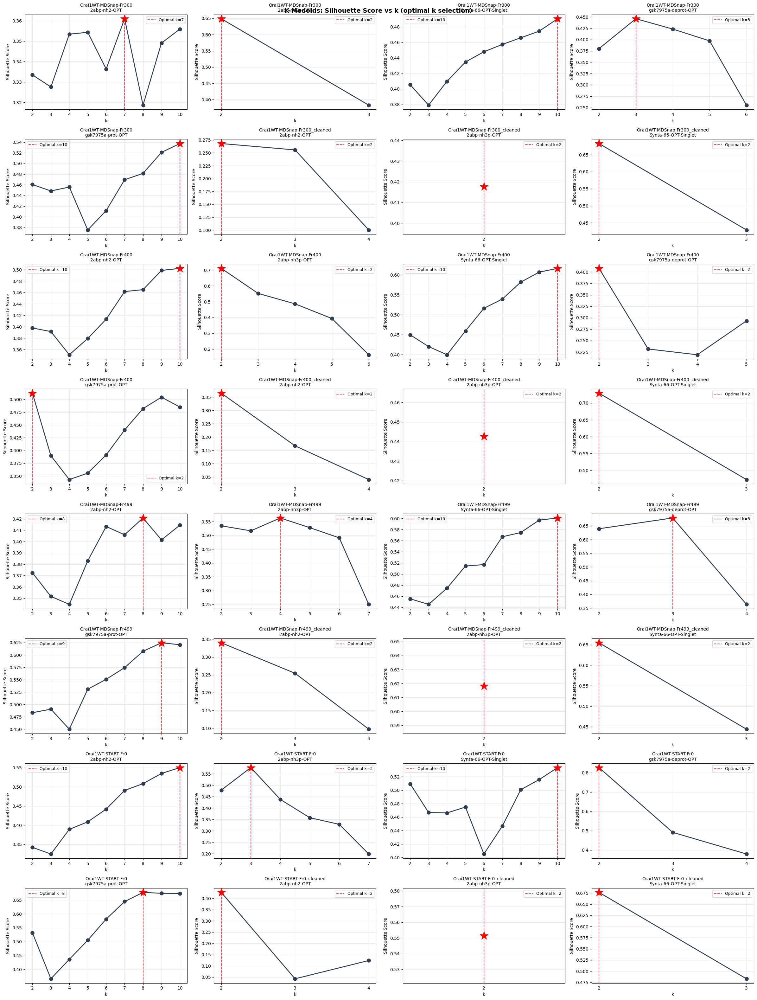

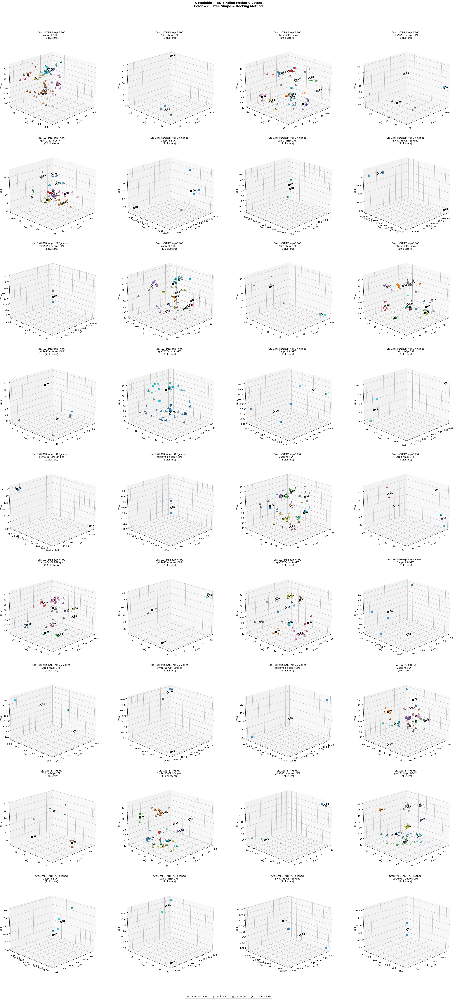

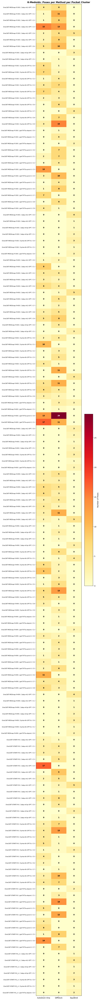


Saved: /home/manndo/master_dev/posebusters_results/clustering_kmedoids_all_poses.csv
Saved: /home/manndo/master_dev/posebusters_results/clustering_kmedoids_pockets.csv


In [ ]:
"""
CELL: K-Medoids Clustering of Binding Pockets
================================================
Cluster all docked poses using K-Medoids.
- Automatically selects optimal k via silhouette score
- Shows poses per docking method in each pocket cluster
- Identifies overlapping vs unique binding pockets
"""

# ============================================================================
# K-MEDOIDS FALLBACK IMPLEMENTATION
# ============================================================================

class SimpleKMedoids:
    """Simple K-Medoids (PAM-like) implementation as fallback."""
    def __init__(self, n_clusters=3, max_iter=300, random_state=42):
        self.n_clusters = n_clusters
        self.max_iter = max_iter
        self.random_state = random_state
        self.labels_ = None
        self.cluster_centers_ = None
        self.medoid_indices_ = None
        self.inertia_ = None

    def fit(self, X):
        np.random.seed(self.random_state)
        n_samples = X.shape[0]
        dist_matrix = squareform(pdist(X, metric='euclidean'))
        medoid_indices = np.random.choice(n_samples, self.n_clusters, replace=False)

        for _ in range(self.max_iter):
            labels = np.argmin(dist_matrix[:, medoid_indices], axis=1)
            new_medoid_indices = medoid_indices.copy()
            for k in range(self.n_clusters):
                cluster_indices = np.where(labels == k)[0]
                if len(cluster_indices) == 0:
                    continue
                cluster_dists = dist_matrix[np.ix_(cluster_indices, cluster_indices)]
                best_idx = cluster_indices[np.argmin(cluster_dists.sum(axis=1))]
                new_medoid_indices[k] = best_idx
            if np.array_equal(medoid_indices, new_medoid_indices):
                break
            medoid_indices = new_medoid_indices

        self.medoid_indices_ = medoid_indices
        self.labels_ = np.argmin(dist_matrix[:, medoid_indices], axis=1)
        self.cluster_centers_ = X[medoid_indices]
        self.inertia_ = sum(
            dist_matrix[i, medoid_indices[self.labels_[i]]] for i in range(n_samples)
        )
        return self

    def fit_predict(self, X):
        self.fit(X)
        return self.labels_


# ============================================================================
# K-MEDOIDS: FIND OPTIMAL K
# ============================================================================

def find_optimal_k_kmedoids(coords, k_range, random_state=42):
    """Find optimal k for K-Medoids using silhouette score."""
    results = {"k": [], "silhouette": [], "inertia": []}
    for k in k_range:
        if k >= len(coords):
            break
        if KMEDOIDS_AVAILABLE:
            model = KMedoids(n_clusters=k, metric='euclidean',
                             random_state=random_state, method='pam')
        else:
            model = SimpleKMedoids(n_clusters=k, random_state=random_state)
        labels = model.fit_predict(coords)
        inertia = model.inertia_
        sil = silhouette_score(coords, labels) if len(set(labels)) > 1 else -1
        results["k"].append(k)
        results["silhouette"].append(sil)
        results["inertia"].append(inertia)
    best_idx = np.argmax(results["silhouette"])
    results["optimal_k"] = results["k"][best_idx]
    results["best_silhouette"] = results["silhouette"][best_idx]
    return results


# ============================================================================
# K-MEDOIDS: CLUSTER PER PROTEIN-LIGAND COMBINATION
# ============================================================================

if df_poses.empty:
    print("ERROR: No poses available. Run the data collection cell first.")
else:
    print("=" * 100)
    print("K-MEDOIDS CLUSTERING OF BINDING POCKETS")
    print("=" * 100)

    df_km = df_poses.copy()
    df_km["cluster_kmedoids"] = -1
    km_cluster_info = {}

    for (protein, ligand), group in df_km.groupby(["protein", "ligand"]):
        combo_key = f"{protein}__{ligand}"
        idx = group.index
        coords = group[["centroid_x", "centroid_y", "centroid_z"]].values
        n_poses = len(coords)

        if n_poses < 3:
            df_km.loc[idx, "cluster_kmedoids"] = 0
            km_cluster_info[combo_key] = {
                "n_poses": n_poses, "optimal_k": 1,
                "best_silhouette": -1, "search_results": None,
            }
            continue

        max_k = min(max(K_RANGE), n_poses - 1)
        actual_k_range = range(2, max_k + 1)

        if len(actual_k_range) == 0:
            df_km.loc[idx, "cluster_kmedoids"] = 0
            km_cluster_info[combo_key] = {
                "n_poses": n_poses, "optimal_k": 1,
                "best_silhouette": -1, "search_results": None,
            }
            continue

        # Find optimal k
        km_results = find_optimal_k_kmedoids(coords, actual_k_range,
                                              random_state=RANDOM_STATE)
        k_opt = km_results["optimal_k"]

        # Final fit with optimal k
        if KMEDOIDS_AVAILABLE:
            km_model = KMedoids(n_clusters=k_opt, metric='euclidean',
                                random_state=RANDOM_STATE, method='pam')
        else:
            km_model = SimpleKMedoids(n_clusters=k_opt, random_state=RANDOM_STATE)

        labels = km_model.fit_predict(coords)
        df_km.loc[idx, "cluster_kmedoids"] = labels

        km_cluster_info[combo_key] = {
            "n_poses": n_poses, "optimal_k": k_opt,
            "best_silhouette": km_results["best_silhouette"],
            "search_results": km_results,
        }

    df_km["cluster_kmedoids"] = df_km["cluster_kmedoids"].astype(int)

    # ========================================================================
    # RESULTS
    # ========================================================================

    # --- Optimal k per combination ---
    print(f"\n  {'Protein-Ligand':<55} {'Optimal k':>10} {'Silhouette':>12} {'Poses':>8}")
    print("  " + "-" * 90)
    for combo_key, info in sorted(km_cluster_info.items()):
        print(f"  {combo_key:<55} {info['optimal_k']:>10} "
              f"{info['best_silhouette']:>12.3f} {info['n_poses']:>8}")

    # --- Cluster statistics table ---
    df_km_stats = compute_cluster_stats(df_km, "cluster_kmedoids")
    df_km_overlap = identify_pocket_overlap(df_km_stats)

    print("\n" + "=" * 100)
    print("K-MEDOIDS — Binding Pocket Clusters (poses per method)")
    print("=" * 100)

    km_display = df_km_overlap[[
        "protein", "ligand", "cluster_id", "n_poses", "radius_A",
        "AutoDock_Vina", "DiffDock", "EquiBind",
        "pocket_type", "n_methods_in_pocket"
    ]].sort_values(["protein", "ligand", "cluster_id"])
    print(km_display.to_string(index=False))

    # --- Overlapping vs unique ---
    print("\n" + "=" * 100)
    print("K-MEDOIDS — Overlapping vs Unique Binding Pockets")
    print("=" * 100)

    pocket_summary_km = df_km_overlap.groupby("pocket_type").agg({
        "n_poses": ["count", "sum"],
        "AutoDock_Vina": "sum",
        "DiffDock": "sum",
        "EquiBind": "sum",
    })
    pocket_summary_km.columns = [
        "N_Clusters", "Total_Poses",
        "AutoDock_Poses", "DiffDock_Poses", "EquiBind_Poses"
    ]
    pocket_summary_km = pocket_summary_km.reset_index()
    print(pocket_summary_km.to_string(index=False))

    # --- Aggregated per protein-ligand ---
    print("\n" + "=" * 100)
    print("K-MEDOIDS — Aggregated per Protein-Ligand")
    print("=" * 100)

    agg_km = df_km_overlap.groupby(["protein", "ligand"]).apply(
        lambda g: pd.Series({
            "n_clusters": len(g),
            "overlapping_pockets": (g["pocket_type"] == "Overlapping").sum(),
            "unique_pockets": (g["n_methods_in_pocket"] == 1).sum(),
            "total_poses": g["n_poses"].sum(),
            "autodock_in_overlapping": g.loc[g["pocket_type"] == "Overlapping", "AutoDock_Vina"].sum(),
            "diffdock_in_overlapping": g.loc[g["pocket_type"] == "Overlapping", "DiffDock"].sum(),
            "equibind_in_overlapping": g.loc[g["pocket_type"] == "Overlapping", "EquiBind"].sum(),
        })
    ).reset_index()
    int_cols = [c for c in agg_km.columns if c not in ["protein", "ligand"]]
    for c in int_cols:
        agg_km[c] = agg_km[c].astype(int)
    print(agg_km.to_string(index=False))

    # --- Silhouette score plots ---
    combos_with_search = [(k, v) for k, v in km_cluster_info.items()
                          if v["search_results"] is not None]

    if combos_with_search:
        n_plots = len(combos_with_search)
        n_cols_sil = 4
        n_rows_sil = (n_plots + n_cols_sil - 1) // n_cols_sil
        fig, axes = plt.subplots(n_rows_sil, n_cols_sil,
                                  figsize=(6 * n_cols_sil, 4 * n_rows_sil), squeeze=False)
        fig.suptitle("K-Medoids: Silhouette Score vs k (optimal k selection)",
                     fontsize=14, fontweight='bold')

        for idx, (combo_key, info) in enumerate(combos_with_search):
            row_i, col_i = divmod(idx, n_cols_sil)
            ax = axes[row_i, col_i]
            sr = info["search_results"]
            ax.plot(sr["k"], sr["silhouette"], 'o-', color='#2c3e50', linewidth=2, markersize=8)
            ax.axvline(x=sr["optimal_k"], color='red', linestyle='--', alpha=0.7,
                       label=f'Optimal k={sr["optimal_k"]}')
            best_i = sr["k"].index(sr["optimal_k"])
            ax.plot(sr["optimal_k"], sr["silhouette"][best_i], '*', color='red',
                    markersize=20, zorder=5)
            ax.set_xlabel("k")
            ax.set_ylabel("Silhouette Score")
            ax.set_title(combo_key.replace("__", "\n"), fontsize=10)
            ax.legend(fontsize=9)
            ax.grid(alpha=0.3)
            ax.set_xticks(sr["k"])

        # Hide unused axes
        for idx in range(n_plots, n_rows_sil * n_cols_sil):
            row_i, col_i = divmod(idx, n_cols_sil)
            axes[row_i, col_i].set_visible(False)

        plt.tight_layout()
        plt.savefig(output_dir / "kmedoids_silhouette_scores.png", dpi=150, bbox_inches='tight')
        plt.show()
        

    # --- 3D scatter ---
    METHOD_COLORS = {"AutoDock_Vina": "#e74c3c", "DiffDock": "#3498db", "EquiBind": "#2ecc71"}
    METHOD_MARKERS = {"AutoDock_Vina": "o", "DiffDock": "^", "EquiBind": "s"}

    combo_groups = list(df_km.groupby(["protein", "ligand"]))
    n_combos = len(combo_groups)
    n_cols_3d = 4
    n_rows_3d = (n_combos + n_cols_3d - 1) // n_cols_3d

    fig3d = plt.figure(figsize=(8 * n_cols_3d, 7 * n_rows_3d))
    fig3d.suptitle("K-Medoids — 3D Binding Pocket Clusters\n"
                   "Color = Cluster, Shape = Docking Method",
                   fontsize=14, fontweight='bold', y=1.02)

    for idx, ((protein, ligand), group) in enumerate(combo_groups):
        row_i, col_i = divmod(idx, n_cols_3d)
        ax = fig3d.add_subplot(n_rows_3d, n_cols_3d, idx + 1, projection='3d')
        n_cl = group["cluster_kmedoids"].nunique()
        cmap = cm.get_cmap('tab10', max(n_cl, 1))

        for _, row in group.iterrows():
            ax.scatter(row["centroid_x"], row["centroid_y"], row["centroid_z"],
                       c=[cmap(int(row["cluster_kmedoids"]))],
                       marker=METHOD_MARKERS.get(row["method"], "o"),
                       s=80, alpha=0.8, edgecolors='black', linewidth=0.5)

        for c_id in range(n_cl):
            mask = group["cluster_kmedoids"] == c_id
            if mask.sum() > 0:
                center = group.loc[mask, ["centroid_x", "centroid_y", "centroid_z"]].mean()
                ax.scatter(*center, c='black', marker='X', s=200,
                           edgecolors='white', linewidth=2, zorder=10)
                ax.text(center["centroid_x"], center["centroid_y"],
                        center["centroid_z"], f'  C{c_id}', fontsize=10, fontweight='bold')

        ax.set_xlabel("X (Å)"); ax.set_ylabel("Y (Å)"); ax.set_zlabel("Z (Å)")
        ax.set_title(f"{protein}\n{ligand}\n({n_cl} clusters)", fontsize=11)
        ax.view_init(elev=20, azim=45)

    legend_elements = [
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='gray',
                   markersize=10, label='AutoDock Vina'),
        plt.Line2D([0], [0], marker='^', color='w', markerfacecolor='gray',
                   markersize=10, label='DiffDock'),
        plt.Line2D([0], [0], marker='s', color='w', markerfacecolor='gray',
                   markersize=10, label='EquiBind'),
        plt.Line2D([0], [0], marker='X', color='w', markerfacecolor='black',
                   markersize=12, label='Cluster Center'),
    ]
    fig3d.legend(handles=legend_elements, loc='lower center', ncol=4,
                 fontsize=10, bbox_to_anchor=(0.5, -0.02))
    plt.tight_layout()
    plt.savefig(output_dir / "kmedoids_3d_clusters.png", dpi=150, bbox_inches='tight')
    plt.show()

    # --- Heatmap ---
    df_heat = df_km_overlap.copy()
    df_heat["pocket_label"] = (df_heat["protein"].str[:20] + " / " +
                                df_heat["ligand"].str[:15] + " / C" +
                                df_heat["cluster_id"].astype(str))
    heat_data = df_heat.set_index("pocket_label")[["AutoDock_Vina", "DiffDock", "EquiBind"]]

    if len(heat_data) > 0:
        fig_h, ax_h = plt.subplots(figsize=(8, max(3, len(heat_data) * 0.5 + 2)))
        im = ax_h.imshow(heat_data.values, cmap='YlOrRd', aspect='auto')
        ax_h.set_xticks(range(3))
        ax_h.set_xticklabels(["AutoDock Vina", "DiffDock", "EquiBind"], fontsize=10)
        ax_h.set_yticks(range(len(heat_data)))
        ax_h.set_yticklabels(heat_data.index, fontsize=8)
        for i in range(len(heat_data)):
            for j in range(3):
                val = int(heat_data.values[i, j])
                color = 'white' if val > heat_data.values.max() * 0.6 else 'black'
                ax_h.text(j, i, str(val), ha='center', va='center',
                          fontsize=10, fontweight='bold', color=color)
        plt.colorbar(im, ax=ax_h, shrink=0.8).set_label("Number of Poses")
        ax_h.set_title("K-Medoids: Poses per Method per Pocket Cluster",
                        fontsize=13, fontweight='bold')
        plt.tight_layout()
        plt.savefig(output_dir / "kmedoids_heatmap.png", dpi=150, bbox_inches='tight')
        plt.show()

    # --- Save ---
    df_km.to_csv(output_dir / "clustering_kmedoids_all_poses.csv", index=False)
    df_km_overlap.to_csv(output_dir / "clustering_kmedoids_pockets.csv", index=False)
    print(f"\nSaved: {output_dir / 'clustering_kmedoids_all_poses.csv'}")
    print(f"Saved: {output_dir / 'clustering_kmedoids_pockets.csv'}")
    print("=" * 100)

HIERARCHICAL CLUSTERING (WARD CRITERIUM) OF BINDING POCKETS

  Protein-Ligand                                           Optimal k   Silhouette    Poses
  ------------------------------------------------------------------------------------------
  Orai1WT-MDSnap-Fr300__2abp-nh2-OPT                              10        0.385       97
  Orai1WT-MDSnap-Fr300__2abp-nh3p-OPT                              2        0.649        4
  Orai1WT-MDSnap-Fr300__Synta-66-OPT-Singlet                      10        0.484       83
  Orai1WT-MDSnap-Fr300__gsk7975a-deprot-OPT                        3        0.446        7
  Orai1WT-MDSnap-Fr300__gsk7975a-prot-OPT                         10        0.529       77
  Orai1WT-MDSnap-Fr300_cleaned__2abp-nh2-OPT                       2        0.278        5
  Orai1WT-MDSnap-Fr300_cleaned__2abp-nh3p-OPT                      2        0.418        3
  Orai1WT-MDSnap-Fr300_cleaned__Synta-66-OPT-Singlet               2        0.683        4
  Orai1WT-MDSnap-Fr300_clea

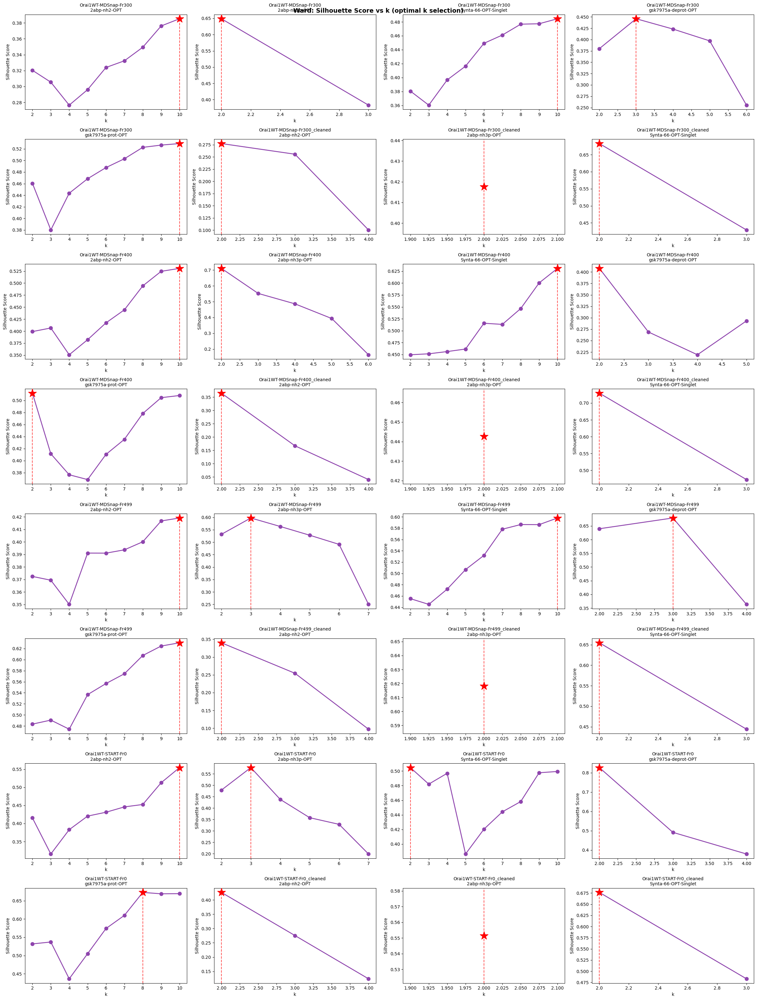

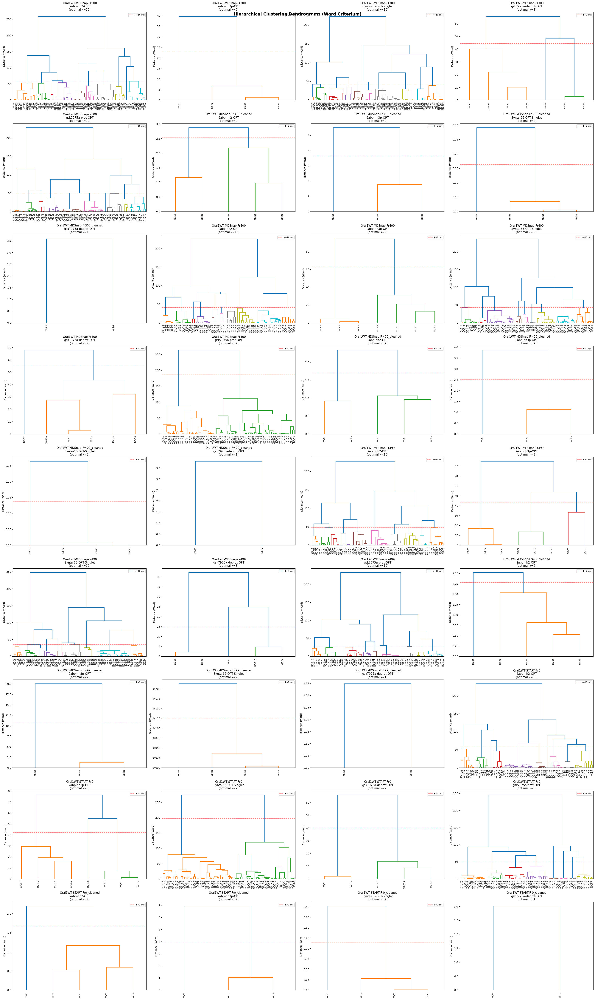

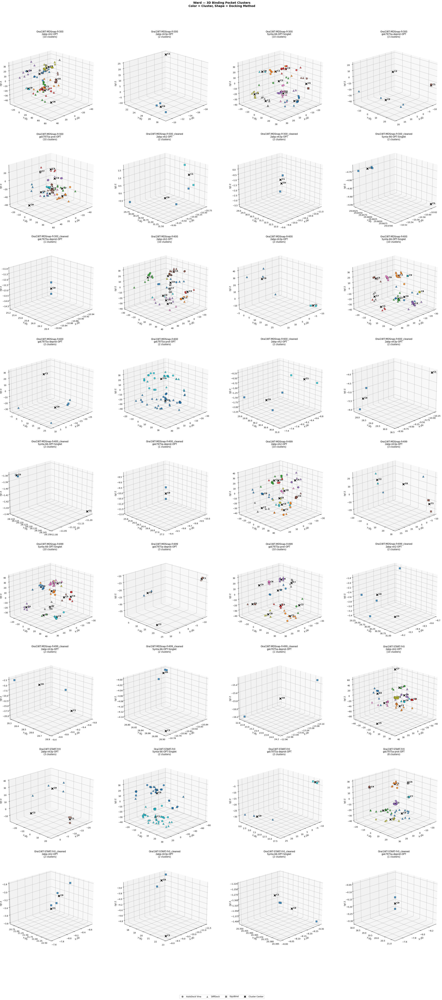

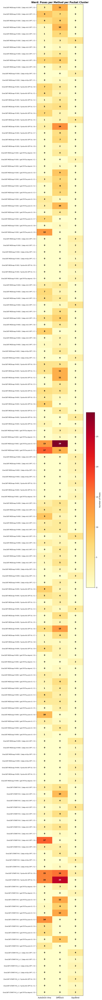


COMPARISON: K-Medoids vs Ward Clustering

  ARI = Adjusted Rand Index (1.0 = identical, 0.0 = random)
  NMI = Normalized Mutual Information (1.0 = identical, 0.0 = independent)

                     protein               ligand  n_poses  k_kmedoids  k_ward    ARI   NMI  same_k
        Orai1WT-MDSnap-Fr300         2abp-nh2-OPT       97           7      10  0.532 0.730   False
        Orai1WT-MDSnap-Fr300        2abp-nh3p-OPT        4           2       2  1.000 1.000    True
        Orai1WT-MDSnap-Fr300 Synta-66-OPT-Singlet       83          10      10  0.837 0.878    True
        Orai1WT-MDSnap-Fr300  gsk7975a-deprot-OPT        7           3       3  1.000 1.000    True
        Orai1WT-MDSnap-Fr300    gsk7975a-prot-OPT       77          10      10  0.932 0.958    True
Orai1WT-MDSnap-Fr300_cleaned         2abp-nh2-OPT        5           2       2 -0.154 0.202    True
Orai1WT-MDSnap-Fr300_cleaned        2abp-nh3p-OPT        3           2       2  1.000 1.000    True
Orai1WT-MDSnap-Fr300_

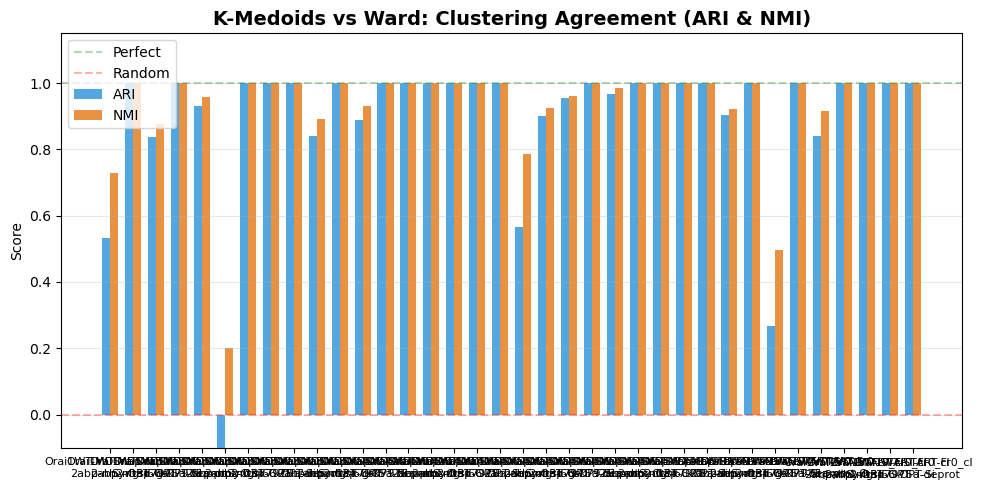


Saved: /home/manndo/master_dev/posebusters_results/clustering_ward_all_poses.csv
Saved: /home/manndo/master_dev/posebusters_results/clustering_ward_pockets.csv

Saved: /home/manndo/master_dev/posebusters_results/clustering_ward_all_poses.csv

Saved: /home/manndo/master_dev/posebusters_results/clustering_ward_all_poses.csv

Saved: /home/manndo/master_dev/posebusters_results/clustering_ward_all_poses.csv
Saved: /home/manndo/master_dev/posebusters_results/clustering_ward_pockets.csv

Saved: /home/manndo/master_dev/posebusters_results/clustering_ward_all_poses.csv
Saved: /home/manndo/master_dev/posebusters_results/clustering_ward_pockets.csv
Saved: /home/manndo/master_dev/posebusters_results/clustering_ward_pockets.csv
Saved: /home/manndo/master_dev/posebusters_results/clustering_ward_pockets.csv


<Figure size 640x480 with 0 Axes>

In [ ]:
"""
CELL: Hierarchical Clustering (Ward Criterium) of Binding Pockets
===================================================================
Cluster all docked poses using Agglomerative Clustering with Ward linkage.
- Automatically selects optimal k via silhouette score
- Shows poses per docking method in each pocket cluster
- Identifies overlapping vs unique binding pockets
- Includes dendrograms
"""

# ============================================================================
# WARD: FIND OPTIMAL K
# ============================================================================

def find_optimal_k_ward(coords, k_range):
    """Find optimal k for Ward clustering using silhouette score."""
    results = {"k": [], "silhouette": [], "inertia": []}
    for k in k_range:
        if k >= len(coords):
            break
        model = AgglomerativeClustering(n_clusters=k, linkage='ward')
        labels = model.fit_predict(coords)
        # Within-cluster sum of squared distances
        inertia = 0
        for c in range(k):
            mask = labels == c
            if mask.sum() > 0:
                center = coords[mask].mean(axis=0)
                inertia += np.sum((coords[mask] - center) ** 2)
        sil = silhouette_score(coords, labels) if len(set(labels)) > 1 else -1
        results["k"].append(k)
        results["silhouette"].append(sil)
        results["inertia"].append(inertia)
    best_idx = np.argmax(results["silhouette"])
    results["optimal_k"] = results["k"][best_idx]
    results["best_silhouette"] = results["silhouette"][best_idx]
    return results


# ============================================================================
# WARD: CLUSTER PER PROTEIN-LIGAND COMBINATION
# ============================================================================

if df_poses.empty:
    print("ERROR: No poses available. Run the data collection cell first.")
else:
    print("=" * 100)
    print("HIERARCHICAL CLUSTERING (WARD CRITERIUM) OF BINDING POCKETS")
    print("=" * 100)

    df_ward = df_poses.copy()
    df_ward["cluster_ward"] = -1
    ward_cluster_info = {}

    for (protein, ligand), group in df_ward.groupby(["protein", "ligand"]):
        combo_key = f"{protein}__{ligand}"
        idx = group.index
        coords = group[["centroid_x", "centroid_y", "centroid_z"]].values
        n_poses = len(coords)

        if n_poses < 3:
            df_ward.loc[idx, "cluster_ward"] = 0
            ward_cluster_info[combo_key] = {
                "n_poses": n_poses, "optimal_k": 1,
                "best_silhouette": -1, "search_results": None,
            }
            continue

        max_k = min(max(K_RANGE), n_poses - 1)
        actual_k_range = range(2, max_k + 1)

        if len(actual_k_range) == 0:
            df_ward.loc[idx, "cluster_ward"] = 0
            ward_cluster_info[combo_key] = {
                "n_poses": n_poses, "optimal_k": 1,
                "best_silhouette": -1, "search_results": None,
            }
            continue

        # Find optimal k
        ward_results = find_optimal_k_ward(coords, actual_k_range)
        k_opt = ward_results["optimal_k"]

        # Final fit with optimal k
        ward_model = AgglomerativeClustering(n_clusters=k_opt, linkage='ward')
        labels = ward_model.fit_predict(coords)
        df_ward.loc[idx, "cluster_ward"] = labels

        ward_cluster_info[combo_key] = {
            "n_poses": n_poses, "optimal_k": k_opt,
            "best_silhouette": ward_results["best_silhouette"],
            "search_results": ward_results,
        }

    df_ward["cluster_ward"] = df_ward["cluster_ward"].astype(int)

    # ========================================================================
    # RESULTS
    # ========================================================================

    # --- Optimal k per combination ---
    print(f"\n  {'Protein-Ligand':<55} {'Optimal k':>10} {'Silhouette':>12} {'Poses':>8}")
    print("  " + "-" * 90)
    for combo_key, info in sorted(ward_cluster_info.items()):
        print(f"  {combo_key:<55} {info['optimal_k']:>10} "
              f"{info['best_silhouette']:>12.3f} {info['n_poses']:>8}")

    # --- Cluster statistics table ---
    df_ward_stats = compute_cluster_stats(df_ward, "cluster_ward")
    df_ward_overlap = identify_pocket_overlap(df_ward_stats)

    print("\n" + "=" * 100)
    print("WARD — Binding Pocket Clusters (poses per method)")
    print("=" * 100)

    ward_display = df_ward_overlap[[
        "protein", "ligand", "cluster_id", "n_poses", "radius_A",
        "AutoDock_Vina", "DiffDock", "EquiBind",
        "pocket_type", "n_methods_in_pocket"
    ]].sort_values(["protein", "ligand", "cluster_id"])
    print(ward_display.to_string(index=False))

    # --- Overlapping vs unique ---
    print("\n" + "=" * 100)
    print("WARD — Overlapping vs Unique Binding Pockets")
    print("=" * 100)

    pocket_summary_ward = df_ward_overlap.groupby("pocket_type").agg({
        "n_poses": ["count", "sum"],
        "AutoDock_Vina": "sum",
        "DiffDock": "sum",
        "EquiBind": "sum",
    })
    pocket_summary_ward.columns = [
        "N_Clusters", "Total_Poses",
        "AutoDock_Poses", "DiffDock_Poses", "EquiBind_Poses"
    ]
    pocket_summary_ward = pocket_summary_ward.reset_index()
    print(pocket_summary_ward.to_string(index=False))

    # --- Aggregated per protein-ligand ---
    print("\n" + "=" * 100)
    print("WARD — Aggregated per Protein-Ligand")
    print("=" * 100)

    agg_ward = df_ward_overlap.groupby(["protein", "ligand"]).apply(
        lambda g: pd.Series({
            "n_clusters": len(g),
            "overlapping_pockets": (g["pocket_type"] == "Overlapping").sum(),
            "unique_pockets": (g["n_methods_in_pocket"] == 1).sum(),
            "total_poses": g["n_poses"].sum(),
            "autodock_in_overlapping": g.loc[g["pocket_type"] == "Overlapping", "AutoDock_Vina"].sum(),
            "diffdock_in_overlapping": g.loc[g["pocket_type"] == "Overlapping", "DiffDock"].sum(),
            "equibind_in_overlapping": g.loc[g["pocket_type"] == "Overlapping", "EquiBind"].sum(),
        })
    ).reset_index()
    int_cols = [c for c in agg_ward.columns if c not in ["protein", "ligand"]]
    for c in int_cols:
        agg_ward[c] = agg_ward[c].astype(int)
    print(agg_ward.to_string(index=False))

    # --- Silhouette score plots ---
    combos_with_search = [(k, v) for k, v in ward_cluster_info.items()
                          if v["search_results"] is not None]

    if combos_with_search:
        n_plots = len(combos_with_search)
        n_cols_sil = min(4, n_plots)
        n_rows_sil = math.ceil(n_plots / n_cols_sil)
        fig, axes = plt.subplots(n_rows_sil, n_cols_sil,
                                 figsize=(6 * n_cols_sil, 4 * n_rows_sil), squeeze=False)
        fig.suptitle("Ward: Silhouette Score vs k (optimal k selection)",
                     fontsize=14, fontweight='bold')

        for idx, (combo_key, info) in enumerate(combos_with_search):
            row_i, col_i = divmod(idx, n_cols_sil)
            ax = axes[row_i, col_i]
            sr = info["search_results"]
            ax.plot(sr["k"], sr["silhouette"], 'o-', color='#8e44ad', linewidth=2, markersize=8)
            ax.axvline(x=sr["optimal_k"], color='red', linestyle='--', alpha=0.7,
                       label=f'Optimal k={sr["optimal_k"]}')
            best_i = sr["k"].index(sr["optimal_k"])
            ax.plot(sr["optimal_k"], sr["silhouette"][best_i], '*', color='red',
                    markersize=20, zorder=5)
            ax.set_xlabel("k")
            ax.set_ylabel("Silhouette Score")
            ax.set_title(combo_key.replace("__", "\n"), fontsize=10)
        # Hide unused axes
        for idx in range(n_plots, n_rows_sil * n_cols_sil):
            row_i, col_i = divmod(idx, n_cols_sil)
            axes[row_i, col_i].set_visible(False)

        plt.tight_layout()
        plt.savefig(output_dir / "ward_silhouette_scores.png", dpi=150, bbox_inches='tight')

    # --- Dendrograms ---
    combo_groups = list(df_ward.groupby(["protein", "ligand"]))
    n_combos = len(combo_groups)
    n_cols = min(4, n_combos)
    n_rows = math.ceil(n_combos / n_cols)

    fig_dend, axes_d = plt.subplots(n_rows, n_cols,
                                    figsize=(8 * n_cols, 6 * n_rows), squeeze=False)
    fig_dend.suptitle("Hierarchical Clustering Dendrograms (Ward Criterium)",
                      fontsize=16, fontweight='bold')

    for idx, ((protein, ligand), group) in enumerate(combo_groups):
        row_i, col_i = divmod(idx, n_cols)
        ax = axes_d[row_i, col_i]
        coords = group[["centroid_x", "centroid_y", "centroid_z"]].values

        if len(coords) < 2:
            ax.text(0.5, 0.5, "Only 1 pose", transform=ax.transAxes,
                    ha='center', va='center')
            ax.set_title(f"{protein}\n{ligand}")
            continue

        Z = linkage(coords, method='ward')

        labels_dend = []
        for _, row in group.iterrows():
            abbrev = {"AutoDock_Vina": "AD", "DiffDock": "DD", "EquiBind": "EB"}.get(
                row["method"], "??")
            labels_dend.append(f"{abbrev}-R{row['pose_rank']}")

        combo_key = f"{protein}__{ligand}"
        info = ward_cluster_info.get(combo_key, {})
        k_opt = info.get("optimal_k", 2)

        color_threshold = None
        if k_opt > 1 and len(Z) >= k_opt:
            color_threshold = (Z[-k_opt + 1, 2] + Z[-k_opt, 2]) / 2

        dendrogram(Z, labels=labels_dend, ax=ax, leaf_rotation=90, leaf_font_size=8,
                   color_threshold=color_threshold)
        ax.set_title(f"{protein}\n{ligand}\n(optimal k={k_opt})", fontsize=11)
        ax.set_ylabel("Distance (Ward)")
        if color_threshold is not None:
            ax.axhline(y=color_threshold, color='red', linestyle='--', alpha=0.5,
                       label=f'k={k_opt} cut')
            ax.legend(fontsize=8)

    # Hide unused axes
    for idx in range(n_combos, n_rows * n_cols):
        row_i, col_i = divmod(idx, n_cols)
        axes_d[row_i, col_i].set_visible(False)

    plt.tight_layout()
    plt.savefig(output_dir / "ward_dendrograms.png", dpi=150, bbox_inches='tight')
    plt.show()
    n_cols_3d = min(4, n_combos)
    n_rows_3d = math.ceil(n_combos / n_cols_3d)
    fig3d = plt.figure(figsize=(8 * n_cols_3d, 7 * n_rows_3d))
    fig3d.suptitle("Ward — 3D Binding Pocket Clusters\n"
                   "Color = Cluster, Shape = Docking Method",
                   fontsize=14, fontweight='bold', y=1.02)

    for idx, ((protein, ligand), group) in enumerate(combo_groups):
        ax = fig3d.add_subplot(n_rows_3d, n_cols_3d, idx + 1, projection='3d')
        n_cl = group["cluster_ward"].nunique()
        cmap = cm.get_cmap('tab10', max(n_cl, 1))

        for _, row in group.iterrows():
            ax.scatter(row["centroid_x"], row["centroid_y"], row["centroid_z"],
                       c=[cmap(int(row["cluster_ward"]))],
                       marker=METHOD_MARKERS.get(row["method"], "o"),
                       s=80, alpha=0.8, edgecolors='black', linewidth=0.5)

        for c_id in range(n_cl):
            mask = group["cluster_ward"] == c_id
            if mask.sum() > 0:
                center = group.loc[mask, ["centroid_x", "centroid_y", "centroid_z"]].mean()
                ax.scatter(*center, c='black', marker='X', s=200,
                           edgecolors='white', linewidth=2, zorder=10)
                ax.text(center["centroid_x"], center["centroid_y"],
                        center["centroid_z"], f'  C{c_id}', fontsize=10, fontweight='bold')

        ax.set_xlabel("X (Å)"); ax.set_ylabel("Y (Å)"); ax.set_zlabel("Z (Å)")
        ax.set_title(f"{protein}\n{ligand}\n({n_cl} clusters)", fontsize=11)
        ax.view_init(elev=20, azim=45)

    legend_elements = [
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='gray',
                   markersize=10, label='AutoDock Vina'),
        plt.Line2D([0], [0], marker='^', color='w', markerfacecolor='gray',
                   markersize=10, label='DiffDock'),
        plt.Line2D([0], [0], marker='s', color='w', markerfacecolor='gray',
                   markersize=10, label='EquiBind'),
        plt.Line2D([0], [0], marker='X', color='w', markerfacecolor='black',
                   markersize=12, label='Cluster Center'),
    ]
    fig3d.legend(handles=legend_elements, loc='lower center', ncol=4,
                 fontsize=10, bbox_to_anchor=(0.5, -0.05))
    plt.tight_layout()
    plt.savefig(output_dir / "ward_3d_clusters.png", dpi=150, bbox_inches='tight')
    plt.show()

    # --- Heatmap ---
    df_heat = df_ward_overlap.copy()
    df_heat["pocket_label"] = (df_heat["protein"].str[:20] + " / " +
                                df_heat["ligand"].str[:15] + " / C" +
                                df_heat["cluster_id"].astype(str))
    heat_data = df_heat.set_index("pocket_label")[["AutoDock_Vina", "DiffDock", "EquiBind"]]

    if len(heat_data) > 0:
        fig_h, ax_h = plt.subplots(figsize=(8, max(3, len(heat_data) * 0.5 + 2)))
        im = ax_h.imshow(heat_data.values, cmap='YlOrRd', aspect='auto')
        ax_h.set_xticks(range(3))
        ax_h.set_xticklabels(["AutoDock Vina", "DiffDock", "EquiBind"], fontsize=10)
        ax_h.set_yticks(range(len(heat_data)))
        ax_h.set_yticklabels(heat_data.index, fontsize=8)
        for i in range(len(heat_data)):
            for j in range(3):
                val = int(heat_data.values[i, j])
                color = 'white' if val > heat_data.values.max() * 0.6 else 'black'
                ax_h.text(j, i, str(val), ha='center', va='center',
                          fontsize=10, fontweight='bold', color=color)
        plt.colorbar(im, ax=ax_h, shrink=0.8).set_label("Number of Poses")
        ax_h.set_title("Ward: Poses per Method per Pocket Cluster",
                        fontsize=13, fontweight='bold')
        plt.tight_layout()
        plt.savefig(output_dir / "ward_heatmap.png", dpi=150, bbox_inches='tight')
        plt.show()

    # --- Compare with K-Medoids if available ---
    if 'df_km' in dir() and not df_km.empty:
        print("\n" + "=" * 100)
        print("COMPARISON: K-Medoids vs Ward Clustering")
        print("=" * 100)

        # Merge cluster labels
        df_combined = df_km[["file_path", "cluster_kmedoids"]].merge(
            df_ward[["file_path", "cluster_ward"]], on="file_path"
        )
        df_combined = df_poses.merge(df_combined, on="file_path")

        comparison = []
        for (protein, ligand), group in df_combined.groupby(["protein", "ligand"]):
            lkm = group["cluster_kmedoids"].values
            lw = group["cluster_ward"].values
            if len(set(lkm)) < 2 or len(set(lw)) < 2:
                ari = 1.0 if np.array_equal(lkm, lw) else 0.0
                nmi = 1.0 if np.array_equal(lkm, lw) else 0.0
            else:
                ari = adjusted_rand_score(lkm, lw)
                nmi = normalized_mutual_info_score(lkm, lw)
            comparison.append({
                "protein": protein, "ligand": ligand, "n_poses": len(group),
                "k_kmedoids": len(set(lkm)), "k_ward": len(set(lw)),
                "ARI": round(ari, 3), "NMI": round(nmi, 3),
                "same_k": len(set(lkm)) == len(set(lw)),
            })

        df_comparison = pd.DataFrame(comparison)

        print("\n  ARI = Adjusted Rand Index (1.0 = identical, 0.0 = random)")
        print("  NMI = Normalized Mutual Information (1.0 = identical, 0.0 = independent)\n")
        print(df_comparison.to_string(index=False))
        print(f"\n  Mean ARI: {df_comparison['ARI'].mean():.3f}")
        print(f"  Mean NMI: {df_comparison['NMI'].mean():.3f}")
        n_same = df_comparison['same_k'].sum()
        print(f"  Same k:   {n_same}/{len(df_comparison)} "
              f"({100*n_same/len(df_comparison):.1f}%)")

        # ARI/NMI bar chart
        fig_c, ax_c = plt.subplots(figsize=(10, 5))
        x = np.arange(len(df_comparison))
        w = 0.35
        ax_c.bar(x - w/2, df_comparison["ARI"], w, label="ARI", color="#3498db", alpha=0.85)
        ax_c.bar(x + w/2, df_comparison["NMI"], w, label="NMI", color="#e67e22", alpha=0.85)
        ax_c.axhline(y=1.0, color='green', linestyle='--', alpha=0.3, label='Perfect')
        ax_c.axhline(y=0.0, color='red', linestyle='--', alpha=0.3, label='Random')
        combo_labels = [f"{r['protein'][:20]}\n{r['ligand'][:15]}"
                        for _, r in df_comparison.iterrows()]
        ax_c.set_xticks(x)
        ax_c.set_xticklabels(combo_labels, fontsize=8)
        ax_c.set_ylabel("Score")
        ax_c.set_title("K-Medoids vs Ward: Clustering Agreement (ARI & NMI)",
                        fontsize=14, fontweight='bold')
        ax_c.legend()
        ax_c.grid(axis='y', alpha=0.3)
        ax_c.set_ylim(-0.1, 1.15)
        plt.tight_layout()
        plt.savefig(output_dir / "clustering_agreement_ari_nmi.png", dpi=150, bbox_inches='tight')
        plt.show()
        plt.tight_layout()
        df_comparison.to_csv(output_dir / "clustering_comparison.csv", index=False)

    # --- Save ---
    df_ward.to_csv(output_dir / "clustering_ward_all_poses.csv", index=False)
    df_ward_overlap.to_csv(output_dir / "clustering_ward_pockets.csv", index=False)
    print(f"\nSaved: {output_dir / 'clustering_ward_all_poses.csv'}")

    print(f"Saved: {output_dir / 'clustering_ward_pockets.csv'}")
    df_ward.to_csv(output_dir / "clustering_ward_all_poses.csv", index=False)
    df_ward_overlap.to_csv(output_dir / "clustering_ward_pockets.csv", index=False)
    df_ward.to_csv(output_dir / "clustering_ward_all_poses.csv", index=False)
    df_ward_overlap.to_csv(output_dir / "clustering_ward_pockets.csv", index=False)   
    print("=" * 100)

    print("=" * 100)
    df_ward_overlap.to_csv(output_dir / "clustering_ward_pockets.csv", index=False)
    print(f"\nSaved: {output_dir / 'clustering_ward_all_poses.csv'}")
    df_ward_overlap.to_csv(output_dir / "clustering_ward_pockets.csv", index=False)
    print(f"\nSaved: {output_dir / 'clustering_ward_all_poses.csv'}")    
    print("=" * 100)

    print(f"\nSaved: {output_dir / 'clustering_ward_all_poses.csv'}")
    print(f"Saved: {output_dir / 'clustering_ward_pockets.csv'}")
    print(f"\nSaved: {output_dir / 'clustering_ward_all_poses.csv'}")
    print(f"Saved: {output_dir / 'clustering_ward_pockets.csv'}")    
    print("=" * 100)

    print(f"Saved: {output_dir / 'clustering_ward_pockets.csv'}")
    print("=" * 100)    
    print(f"Saved: {output_dir / 'clustering_ward_pockets.csv'}")

Using Ward clustering results for selection.

CONFORMITY SCORES FOR ALL PROTEIN-LIGAND COMBINATIONS
(Higher score = more conforming clusters across methods)
             protein               ligand  n_poses  n_methods  n_clusters  overlapping_clusters  overlap_fraction  mean_inter_method_dist  spatial_spread  conformity_score
Orai1WT-MDSnap-Fr400    gsk7975a-prot-OPT       70          2           2                     2             1.000                   15.68           28.48            0.6960
   Orai1WT-START-Fr0 Synta-66-OPT-Singlet       74          3           2                     2             1.000                   17.54           29.06            0.6811
Orai1WT-MDSnap-Fr400  gsk7975a-deprot-OPT        6          2           2                     1             0.833                   14.84           23.58            0.6671
Orai1WT-MDSnap-Fr499         2abp-nh2-OPT       69          3          10                     9             0.942                   19.30           30.29  

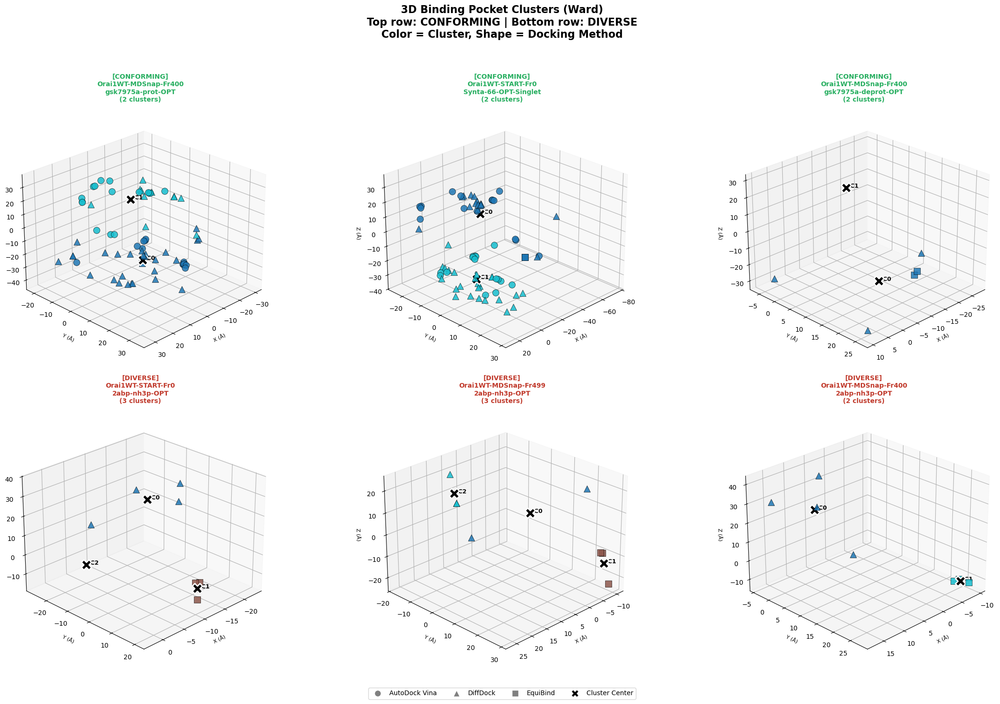

Saved: /home/manndo/master_dev/posebusters_results/selected_3d_clusters.png

GENERATING INTER-POCKET DISTANCE HEATMAPS...


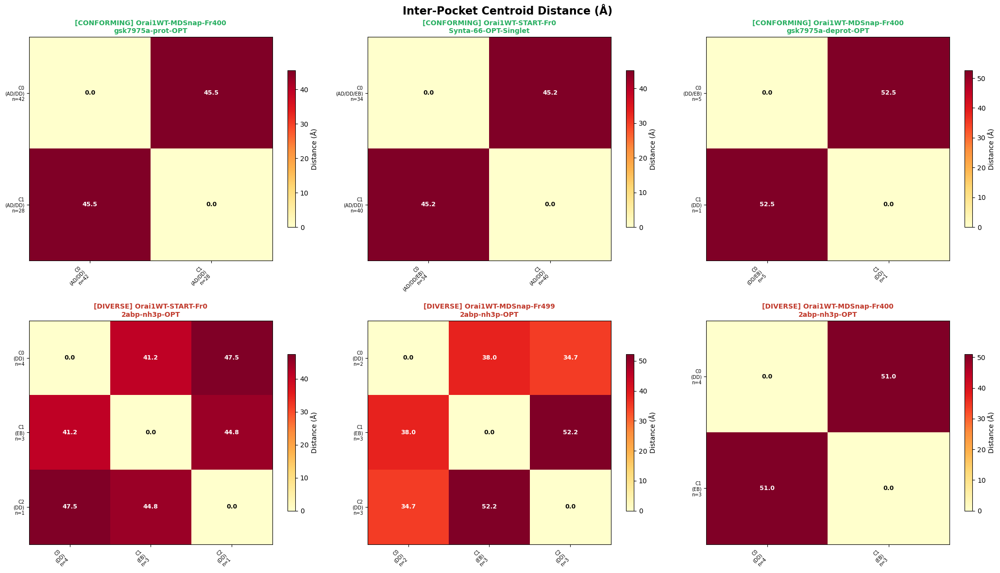

Saved: /home/manndo/master_dev/posebusters_results/selected_pocket_distances.png

COMPUTING BALANCED RMSD COMPARISONS...
(Using up to 5 poses per method per pocket)

RMSD COMPARISON TABLE (balanced poses per method)
             protein               ligand   category  cluster_id      method_1      method_2  n_poses_m1  n_poses_m2  mean_rmsd  median_rmsd  min_rmsd  max_rmsd  std_rmsd
Orai1WT-MDSnap-Fr400    gsk7975a-prot-OPT CONFORMING           0 AutoDock_Vina      DiffDock           5           5      28.64        28.37     10.10     43.47      8.04
Orai1WT-MDSnap-Fr400    gsk7975a-prot-OPT CONFORMING           0 AutoDock_Vina AutoDock_Vina           5           5       3.19         3.25      2.22      3.79      0.45
Orai1WT-MDSnap-Fr400    gsk7975a-prot-OPT CONFORMING           0      DiffDock      DiffDock           5           5       6.35         8.29      0.00      8.70      2.85
Orai1WT-MDSnap-Fr400    gsk7975a-prot-OPT CONFORMING           1 AutoDock_Vina      DiffDock        

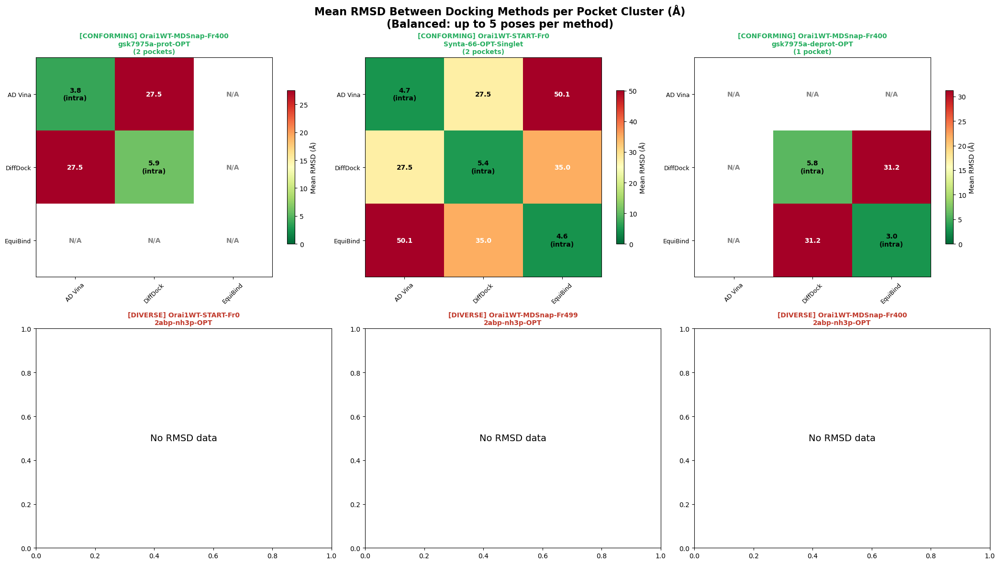

Saved: /home/manndo/master_dev/posebusters_results/selected_rmsd_heatmaps.png


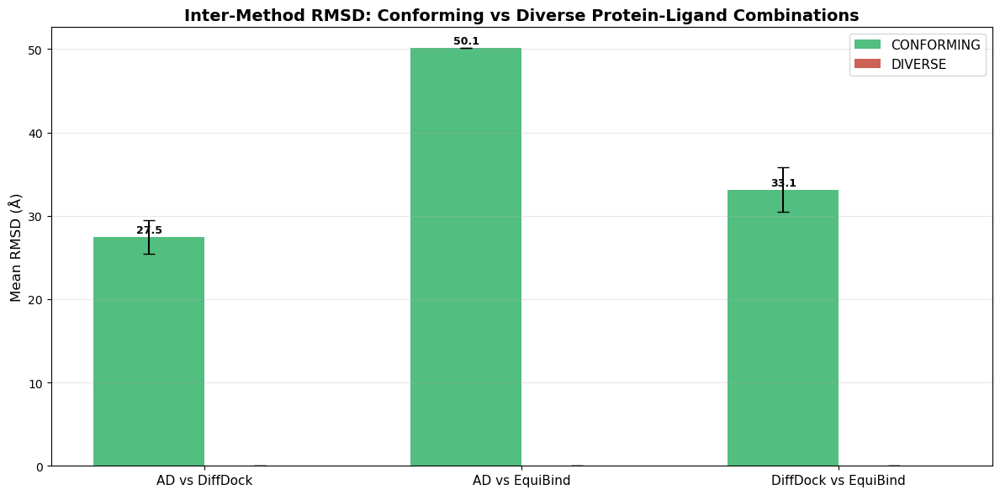

Saved: /home/manndo/master_dev/posebusters_results/selected_rmsd_conform_vs_diverse.png

Saved: /home/manndo/master_dev/posebusters_results/selected_rmsd_comparison.csv
Saved: /home/manndo/master_dev/posebusters_results/conformity_scores_all.csv

SUMMARY

  Clustering method used: Ward
  Total protein-ligand combinations scored: 20
  Selected conforming:  3
  Selected diverse:     3

  CONFORMING — inter-method RMSD: mean=32.34 Å, median=29.67 Å




In [ ]:
"""
CELL: Conformity vs Diversity Analysis
========================================
Select 3 protein-ligand combinations with highly CONFORMING clusters
and 3 with highly DIVERSE clusters across docking methods.

Visualize:
1. 3D scatter plots of poses and clusters
2. Heatmap of inter-pocket distances
3. RMSD comparison across docking methods (balanced sampling)
"""

import numpy as np
import pandas as pd
from pathlib import Path
from itertools import combinations, product
import warnings
warnings.filterwarnings('ignore')

from rdkit import Chem
from rdkit.Chem import AllChem, rdMolAlign
from sklearn.metrics import silhouette_score
from scipy.spatial.distance import pdist, squareform, cdist
from scipy.cluster.hierarchy import linkage, fcluster
import matplotlib.pyplot as plt
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.patches as mpatches
import matplotlib.gridspec as gridspec

# ============================================================================
# CONFIGURATION
# ============================================================================
N_BALANCED_POSES = 5  # number of poses per method for balanced RMSD comparison
METHOD_COLORS = {"AutoDock_Vina": "#e74c3c", "DiffDock": "#3498db", "EquiBind": "#2ecc71"}
METHOD_MARKERS = {"AutoDock_Vina": "o", "DiffDock": "^", "EquiBind": "s"}
METHODS_LIST = ["AutoDock_Vina", "DiffDock", "EquiBind"]

# ============================================================================
# HELPER FUNCTIONS
# ============================================================================

def load_mol_from_sdf(sdf_path):
    """Load molecule from SDF, return mol with conformer or None."""
    try:
        mol = Chem.MolFromMolFile(str(sdf_path), removeHs=False, sanitize=False)
        if mol is not None and mol.GetNumConformers() > 0:
            return mol
    except Exception:
        pass
    return None


def get_heavy_atom_coords(sdf_path):
    """Get heavy-atom coordinates from SDF file."""
    try:
        mol = Chem.MolFromMolFile(str(sdf_path), removeHs=True, sanitize=False)
        if mol is None:
            mol = Chem.MolFromMolFile(str(sdf_path), removeHs=False, sanitize=False)
            if mol is not None:
                mol = Chem.RemoveHs(mol)
        if mol is None or mol.GetNumConformers() == 0:
            return None
        conf = mol.GetConformer()
        return np.array([
            [conf.GetAtomPosition(i).x, conf.GetAtomPosition(i).y, conf.GetAtomPosition(i).z]
            for i in range(mol.GetNumAtoms())
        ])
    except Exception:
        return None


def compute_centroid_rmsd(coords1, coords2):
    """Compute RMSD between two sets of coordinates using centroid alignment.
    If atom counts differ, use centroid distance as proxy."""
    if coords1 is None or coords2 is None:
        return np.nan
    if len(coords1) == len(coords2):
        # Kabsch-like: center both, compute RMSD
        c1 = coords1 - coords1.mean(axis=0)
        c2 = coords2 - coords2.mean(axis=0)
        diff = c1 - c2
        return np.sqrt(np.mean(np.sum(diff ** 2, axis=1)))
    else:
        # Different atom counts: use centroid distance
        return np.linalg.norm(coords1.mean(axis=0) - coords2.mean(axis=0))


def compute_rdkit_rmsd(mol1, mol2):
    """Compute RMSD using RDKit's GetBestRMS (handles atom mapping)."""
    try:
        if mol1 is None or mol2 is None:
            return np.nan
        # Remove hydrogens for comparison
        m1 = Chem.RemoveHs(mol1)
        m2 = Chem.RemoveHs(mol2)
        if m1.GetNumAtoms() != m2.GetNumAtoms():
            # Fall back to centroid distance
            c1 = m1.GetConformer()
            c2 = m2.GetConformer()
            coords1 = np.array([[c1.GetAtomPosition(i).x, c1.GetAtomPosition(i).y, c1.GetAtomPosition(i).z]
                                 for i in range(m1.GetNumAtoms())])
            coords2 = np.array([[c2.GetAtomPosition(i).x, c2.GetAtomPosition(i).y, c2.GetAtomPosition(i).z]
                                 for i in range(m2.GetNumAtoms())])
            return np.linalg.norm(coords1.mean(axis=0) - coords2.mean(axis=0))
        rmsd = rdMolAlign.GetBestRMS(m1, m2)
        return rmsd
    except Exception:
        return np.nan


def score_conformity(group_df, cluster_col):
    """
    Score how conforming a protein-ligand combination is across methods.
    High conformity = all 3 methods place poses in the same cluster(s),
    low spread, high overlap.
    
    Returns a dict with conformity metrics.
    """
    n_clusters = group_df[cluster_col].nunique()
    n_methods = group_df["method"].nunique()
    n_poses = len(group_df)
    
    # Count how many clusters contain poses from all 3 methods
    overlapping_clusters = 0
    total_overlap_poses = 0
    for c_id, c_group in group_df.groupby(cluster_col):
        methods_in_cluster = c_group["method"].nunique()
        if methods_in_cluster >= 2:
            overlapping_clusters += 1
            total_overlap_poses += len(c_group)
    
    # Fraction of poses in overlapping clusters
    overlap_fraction = total_overlap_poses / n_poses if n_poses > 0 else 0
    
    # Compute mean pairwise centroid distance between methods
    method_centroids = {}
    for method, m_group in group_df.groupby("method"):
        coords = m_group[["centroid_x", "centroid_y", "centroid_z"]].values
        method_centroids[method] = coords.mean(axis=0)
    
    inter_method_dist = []
    for (m1, c1), (m2, c2) in combinations(method_centroids.items(), 2):
        inter_method_dist.append(np.linalg.norm(c1 - c2))
    mean_inter_method_dist = np.mean(inter_method_dist) if inter_method_dist else 0
    
    # Compute spatial spread (mean distance of all poses from global centroid)
    all_coords = group_df[["centroid_x", "centroid_y", "centroid_z"]].values
    global_centroid = all_coords.mean(axis=0)
    spread = np.mean(np.linalg.norm(all_coords - global_centroid, axis=1))
    
    # Conformity score: high overlap + low inter-method distance + low spread + few clusters
    # Normalize to 0-1 range approximately
    conformity_score = (
        overlap_fraction * 0.4 +
        max(0, 1 - mean_inter_method_dist / 50) * 0.3 +
        max(0, 1 - spread / 30) * 0.2 +
        max(0, 1 - n_clusters / 10) * 0.1
    )
    
    return {
        "n_clusters": n_clusters,
        "n_methods": n_methods,
        "n_poses": n_poses,
        "overlapping_clusters": overlapping_clusters,
        "overlap_fraction": round(overlap_fraction, 3),
        "mean_inter_method_dist": round(mean_inter_method_dist, 2),
        "spatial_spread": round(spread, 2),
        "conformity_score": round(conformity_score, 4),
    }


# ============================================================================
# STEP 1: SCORE ALL PROTEIN-LIGAND COMBINATIONS
# ============================================================================

# Check which data is available (prefer Ward, fall back to K-Medoids)
if 'df_ward' in dir() and not df_ward.empty:
    df_analysis = df_ward.copy()
    cluster_col = "cluster_ward"
    clustering_label = "Ward"
    print("Using Ward clustering results for selection.")
elif 'df_km' in dir() and not df_km.empty:
    df_analysis = df_km.copy()
    cluster_col = "cluster_kmedoids"
    clustering_label = "K-Medoids"
    print("Using K-Medoids clustering results for selection.")
else:
    raise RuntimeError("No clustering results found. Run K-Medoids or Ward cell first.")

# Only consider combinations with poses from at least 2 methods
combo_scores = []
for (protein, ligand), group in df_analysis.groupby(["protein", "ligand"]):
    n_methods = group["method"].nunique()
    if n_methods < 2:
        continue
    
    scores = score_conformity(group, cluster_col)
    scores["protein"] = protein
    scores["ligand"] = ligand
    combo_scores.append(scores)

df_scores = pd.DataFrame(combo_scores).sort_values("conformity_score", ascending=False)

print("\n" + "=" * 120)
print("CONFORMITY SCORES FOR ALL PROTEIN-LIGAND COMBINATIONS")
print("(Higher score = more conforming clusters across methods)")
print("=" * 120)
print(df_scores[[
    "protein", "ligand", "n_poses", "n_methods", "n_clusters",
    "overlapping_clusters", "overlap_fraction",
    "mean_inter_method_dist", "spatial_spread", "conformity_score"
]].to_string(index=False))

# ============================================================================
# STEP 2: SELECT TOP 3 CONFORMING AND TOP 3 DIVERSE
# ============================================================================

n_available = len(df_scores)
n_conform = min(3, n_available // 2) if n_available >= 2 else min(1, n_available)
n_diverse = min(3, n_available - n_conform)

top_conform = df_scores.head(n_conform)
top_diverse = df_scores.tail(n_diverse)

# Make sure no overlap
diverse_keys = set(zip(top_diverse["protein"], top_diverse["ligand"]))
conform_keys = set(zip(top_conform["protein"], top_conform["ligand"]))
if diverse_keys & conform_keys:
    # Remove overlapping from diverse, take next available
    remaining = df_scores[~df_scores.apply(
        lambda r: (r["protein"], r["ligand"]) in conform_keys, axis=1
    )]
    top_diverse = remaining.tail(n_diverse)

print("\n" + "=" * 120)
print(f"SELECTED — TOP {n_conform} HIGHLY CONFORMING combinations:")
print("=" * 120)
for _, row in top_conform.iterrows():
    print(f"  {row['protein']} + {row['ligand']:>30}  "
          f"(score={row['conformity_score']:.4f}, "
          f"overlap={row['overlap_fraction']:.1%}, "
          f"inter-method dist={row['mean_inter_method_dist']:.1f} Å, "
          f"clusters={row['n_clusters']})")

print(f"\nSELECTED — TOP {n_diverse} HIGHLY DIVERSE combinations:")
print("=" * 120)
for _, row in top_diverse.iterrows():
    print(f"  {row['protein']} + {row['ligand']:>30}  "
          f"(score={row['conformity_score']:.4f}, "
          f"overlap={row['overlap_fraction']:.1%}, "
          f"inter-method dist={row['mean_inter_method_dist']:.1f} Å, "
          f"clusters={row['n_clusters']})")

selected_conform = list(zip(top_conform["protein"], top_conform["ligand"]))
selected_diverse = list(zip(top_diverse["protein"], top_diverse["ligand"]))
all_selected = selected_conform + selected_diverse
category_map = {}
for p, l in selected_conform:
    category_map[(p, l)] = "CONFORMING"
for p, l in selected_diverse:
    category_map[(p, l)] = "DIVERSE"


# ============================================================================
# STEP 3: 3D SCATTER PLOTS
# ============================================================================

print("\n" + "=" * 120)
print("GENERATING 3D SCATTER PLOTS...")
print("=" * 120)

n_selected = len(all_selected)
fig_3d = plt.figure(figsize=(8 * min(n_selected, 3), 7 * ((n_selected + 2) // 3)))
fig_3d.suptitle(
    f"3D Binding Pocket Clusters ({clustering_label})\n"
    "Top row: CONFORMING | Bottom row: DIVERSE\n"
    "Color = Cluster, Shape = Docking Method",
    fontsize=16, fontweight='bold', y=1.03
)

for plot_idx, (protein, ligand) in enumerate(all_selected):
    group = df_analysis[
        (df_analysis["protein"] == protein) & (df_analysis["ligand"] == ligand)
    ]
    category = category_map[(protein, ligand)]
    
    ax = fig_3d.add_subplot(
        (n_selected + 2) // 3, min(n_selected, 3), plot_idx + 1, projection='3d'
    )
    
    n_cl = group[cluster_col].nunique()
    cmap_clusters = cm.get_cmap('tab10', max(n_cl, 1))
    
    # Plot each pose
    for _, row in group.iterrows():
        c_id = int(row[cluster_col])
        method = row["method"]
        ax.scatter(
            row["centroid_x"], row["centroid_y"], row["centroid_z"],
            c=[cmap_clusters(c_id)],
            marker=METHOD_MARKERS.get(method, "o"),
            s=100, alpha=0.85, edgecolors='black', linewidth=0.5
        )
    
    # Plot cluster centers
    for c_id in group[cluster_col].unique():
        mask = group[cluster_col] == c_id
        if mask.sum() > 0:
            center = group.loc[mask, ["centroid_x", "centroid_y", "centroid_z"]].mean()
            ax.scatter(
                center["centroid_x"], center["centroid_y"], center["centroid_z"],
                c='black', marker='X', s=250, edgecolors='white', linewidth=2, zorder=10
            )
            ax.text(
                center["centroid_x"], center["centroid_y"], center["centroid_z"],
                f'  C{c_id}', fontsize=9, fontweight='bold', color='black'
            )
    
    # Title with category badge
    badge_color = '#27ae60' if category == "CONFORMING" else '#c0392b'
    ax.set_title(
        f"[{category}]\n{protein}\n{ligand}\n({n_cl} clusters)",
        fontsize=10, fontweight='bold', color=badge_color
    )
    ax.set_xlabel("X (Å)", fontsize=8)
    ax.set_ylabel("Y (Å)", fontsize=8)
    ax.set_zlabel("Z (Å)", fontsize=8)
    ax.view_init(elev=25, azim=45)

# Legend
legend_elements = [
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='gray',
               markersize=10, label='AutoDock Vina'),
    plt.Line2D([0], [0], marker='^', color='w', markerfacecolor='gray',
               markersize=10, label='DiffDock'),
    plt.Line2D([0], [0], marker='s', color='w', markerfacecolor='gray',
               markersize=10, label='EquiBind'),
    plt.Line2D([0], [0], marker='X', color='w', markerfacecolor='black',
               markersize=12, label='Cluster Center'),
]
fig_3d.legend(handles=legend_elements, loc='lower center', ncol=4,
              fontsize=10, bbox_to_anchor=(0.5, -0.04))
plt.tight_layout()
plt.savefig(output_dir / "selected_3d_clusters.png", dpi=150, bbox_inches='tight')
plt.show()
print(f"Saved: {output_dir / 'selected_3d_clusters.png'}")


# ============================================================================
# STEP 4: INTER-POCKET DISTANCE HEATMAPS
# ============================================================================

print("\n" + "=" * 120)
print("GENERATING INTER-POCKET DISTANCE HEATMAPS...")
print("=" * 120)

n_rows = (n_selected + 2) // 3
n_cols = min(n_selected, 3)
fig_dist, axes_dist = plt.subplots(n_rows, n_cols, figsize=(7 * n_cols, 6 * n_rows),
                                    squeeze=False)
fig_dist.suptitle("Inter-Pocket Centroid Distance (Å)", fontsize=16, fontweight='bold')

for plot_idx, (protein, ligand) in enumerate(all_selected):
    row_i, col_i = divmod(plot_idx, n_cols)
    ax = axes_dist[row_i][col_i]
    category = category_map[(protein, ligand)]
    
    group = df_analysis[
        (df_analysis["protein"] == protein) & (df_analysis["ligand"] == ligand)
    ]
    
    # Compute cluster centers
    cluster_centers = {}
    for c_id, c_group in group.groupby(cluster_col):
        coords = c_group[["centroid_x", "centroid_y", "centroid_z"]].values
        center = coords.mean(axis=0)
        methods_present = sorted(c_group["method"].unique())
        methods_str = "/".join([
            {"AutoDock_Vina": "AD", "DiffDock": "DD", "EquiBind": "EB"}.get(m, "?")
            for m in methods_present
        ])
        cluster_centers[c_id] = {
            "center": center,
            "label": f"C{c_id}\n({methods_str})\nn={len(c_group)}",
            "n_poses": len(c_group),
        }
    
    cluster_ids = sorted(cluster_centers.keys())
    n_cl = len(cluster_ids)
    
    if n_cl < 2:
        ax.text(0.5, 0.5, f"Only {n_cl} cluster", transform=ax.transAxes,
                ha='center', va='center', fontsize=14)
        badge_color = '#27ae60' if category == "CONFORMING" else '#c0392b'
        ax.set_title(f"[{category}] {protein}\n{ligand}", fontsize=10,
                     fontweight='bold', color=badge_color)
        continue
    
    # Distance matrix between cluster centers
    centers_array = np.array([cluster_centers[c]["center"] for c in cluster_ids])
    dist_matrix = squareform(pdist(centers_array, metric='euclidean'))
    
    # Plot heatmap
    im = ax.imshow(dist_matrix, cmap='YlOrRd', aspect='auto')
    
    labels = [cluster_centers[c]["label"] for c in cluster_ids]
    ax.set_xticks(range(n_cl))
    ax.set_xticklabels(labels, fontsize=7, rotation=45, ha='right')
    ax.set_yticks(range(n_cl))
    ax.set_yticklabels(labels, fontsize=7)
    
    # Annotate distances
    for i in range(n_cl):
        for j in range(n_cl):
            color = 'white' if dist_matrix[i, j] > dist_matrix.max() * 0.6 else 'black'
            ax.text(j, i, f"{dist_matrix[i, j]:.1f}", ha='center', va='center',
                    fontsize=9, fontweight='bold', color=color)
    
    plt.colorbar(im, ax=ax, shrink=0.7, label="Distance (Å)")
    badge_color = '#27ae60' if category == "CONFORMING" else '#c0392b'
    ax.set_title(f"[{category}] {protein}\n{ligand}", fontsize=10,
                 fontweight='bold', color=badge_color)

# Hide unused axes
for idx in range(n_selected, n_rows * n_cols):
    row_i, col_i = divmod(idx, n_cols)
    axes_dist[row_i][col_i].set_visible(False)

plt.tight_layout()
plt.savefig(output_dir / "selected_pocket_distances.png", dpi=150, bbox_inches='tight')
plt.show()
print(f"Saved: {output_dir / 'selected_pocket_distances.png'}")


# ============================================================================
# STEP 5: BALANCED RMSD COMPARISON ACROSS DOCKING METHODS
# ============================================================================

print("\n" + "=" * 120)
print("COMPUTING BALANCED RMSD COMPARISONS...")
print(f"(Using up to {N_BALANCED_POSES} poses per method per pocket)")
print("=" * 120)

all_rmsd_records = []

for (protein, ligand) in all_selected:
    category = category_map[(protein, ligand)]
    group = df_analysis[
        (df_analysis["protein"] == protein) & (df_analysis["ligand"] == ligand)
    ]
    
    # For each cluster (pocket), sample balanced poses
    for c_id, c_group in group.groupby(cluster_col):
        method_poses = {}
        for method in METHODS_LIST:
            m_group = c_group[c_group["method"] == method]
            if len(m_group) == 0:
                continue
            # Sample up to N_BALANCED_POSES (prefer top-ranked)
            m_sorted = m_group.sort_values("pose_rank")
            sampled = m_sorted.head(N_BALANCED_POSES)
            
            # Load coordinates for each pose
            pose_coords = []
            pose_files = []
            for _, row in sampled.iterrows():
                coords = get_heavy_atom_coords(row["file_path"])
                if coords is not None:
                    pose_coords.append(coords)
                    pose_files.append(row["file_path"])
            
            if pose_coords:
                method_poses[method] = {
                    "coords": pose_coords,
                    "files": pose_files,
                    "n_used": len(pose_coords),
                }
        
        # Compute pairwise RMSD between all methods in this pocket
        available_methods = sorted(method_poses.keys())
        
        if len(available_methods) < 2:
            continue
        
        # Balance: use the minimum number of poses across available methods
        min_n = min(method_poses[m]["n_used"] for m in available_methods)
        
        for m1, m2 in combinations(available_methods, 2):
            coords1_list = method_poses[m1]["coords"][:min_n]
            coords2_list = method_poses[m2]["coords"][:min_n]
            
            # Compute all pairwise RMSDs between poses from m1 and m2
            pairwise_rmsds = []
            for c1 in coords1_list:
                for c2 in coords2_list:
                    r = compute_centroid_rmsd(c1, c2)
                    if not np.isnan(r):
                        pairwise_rmsds.append(r)
            
            if pairwise_rmsds:
                all_rmsd_records.append({
                    "protein": protein,
                    "ligand": ligand,
                    "category": category,
                    "cluster_id": c_id,
                    "method_1": m1,
                    "method_2": m2,
                    "n_poses_m1": len(coords1_list),
                    "n_poses_m2": len(coords2_list),
                    "mean_rmsd": round(np.mean(pairwise_rmsds), 2),
                    "median_rmsd": round(np.median(pairwise_rmsds), 2),
                    "min_rmsd": round(np.min(pairwise_rmsds), 2),
                    "max_rmsd": round(np.max(pairwise_rmsds), 2),
                    "std_rmsd": round(np.std(pairwise_rmsds), 2),
                })
        
        # Also compute intra-method RMSD
        for method in available_methods:
            coords_list = method_poses[method]["coords"][:min_n]
            if len(coords_list) < 2:
                continue
            intra_rmsds = []
            for c1, c2 in combinations(coords_list, 2):
                r = compute_centroid_rmsd(c1, c2)
                if not np.isnan(r):
                    intra_rmsds.append(r)
            if intra_rmsds:
                all_rmsd_records.append({
                    "protein": protein,
                    "ligand": ligand,
                    "category": category,
                    "cluster_id": c_id,
                    "method_1": method,
                    "method_2": method,
                    "n_poses_m1": len(coords_list),
                    "n_poses_m2": len(coords_list),
                    "mean_rmsd": round(np.mean(intra_rmsds), 2),
                    "median_rmsd": round(np.median(intra_rmsds), 2),
                    "min_rmsd": round(np.min(intra_rmsds), 2),
                    "max_rmsd": round(np.max(intra_rmsds), 2),
                    "std_rmsd": round(np.std(intra_rmsds), 2),
                })

df_rmsd = pd.DataFrame(all_rmsd_records)

if not df_rmsd.empty:
    print("\n" + "=" * 120)
    print("RMSD COMPARISON TABLE (balanced poses per method)")
    print("=" * 120)
    print(df_rmsd.to_string(index=False))
    
    # ========================================================================
    # STEP 6: RMSD HEATMAPS PER SELECTED COMBINATION
    # ========================================================================
    
    print("\n" + "=" * 120)
    print("GENERATING RMSD HEATMAPS...")
    print("=" * 120)
    
    fig_rmsd, axes_rmsd = plt.subplots(n_rows, n_cols, figsize=(7 * n_cols, 6 * n_rows),
                                        squeeze=False)
    fig_rmsd.suptitle(
        "Mean RMSD Between Docking Methods per Pocket Cluster (Å)\n"
        f"(Balanced: up to {N_BALANCED_POSES} poses per method)",
        fontsize=16, fontweight='bold'
    )
    
    for plot_idx, (protein, ligand) in enumerate(all_selected):
        row_i, col_i = divmod(plot_idx, n_cols)
        ax = axes_rmsd[row_i][col_i]
        category = category_map[(protein, ligand)]
        
        df_sub = df_rmsd[
            (df_rmsd["protein"] == protein) & (df_rmsd["ligand"] == ligand)
        ]
        
        if df_sub.empty:
            ax.text(0.5, 0.5, "No RMSD data", transform=ax.transAxes,
                    ha='center', va='center', fontsize=14)
            badge_color = '#27ae60' if category == "CONFORMING" else '#c0392b'
            ax.set_title(f"[{category}] {protein}\n{ligand}", fontsize=10,
                         fontweight='bold', color=badge_color)
            continue
        
        # Get unique clusters
        clusters = sorted(df_sub["cluster_id"].unique())
        
        # For each cluster, build a method x method RMSD matrix
        # Then aggregate across clusters (mean)
        method_labels = METHODS_LIST
        n_m = len(method_labels)
        
        # Overall aggregated RMSD matrix
        rmsd_matrix = np.full((n_m, n_m), np.nan)
        
        for i, m1 in enumerate(method_labels):
            for j, m2 in enumerate(method_labels):
                # Get all RMSD values for this method pair across all clusters
                mask = (
                    ((df_sub["method_1"] == m1) & (df_sub["method_2"] == m2)) |
                    ((df_sub["method_1"] == m2) & (df_sub["method_2"] == m1))
                )
                sub = df_sub[mask]
                if not sub.empty:
                    rmsd_matrix[i, j] = sub["mean_rmsd"].mean()
        
        # Plot
        im = ax.imshow(rmsd_matrix, cmap='RdYlGn_r', aspect='auto',
                       vmin=0, vmax=max(np.nanmax(rmsd_matrix), 5))
        
        ax.set_xticks(range(n_m))
        ax.set_xticklabels(["AD Vina", "DiffDock", "EquiBind"], fontsize=9, rotation=45)
        ax.set_yticks(range(n_m))
        ax.set_yticklabels(["AD Vina", "DiffDock", "EquiBind"], fontsize=9)
        
        # Annotate
        for i in range(n_m):
            for j in range(n_m):
                val = rmsd_matrix[i, j]
                if np.isnan(val):
                    ax.text(j, i, "N/A", ha='center', va='center',
                            fontsize=10, fontweight='bold', color='gray')
                else:
                    color = 'white' if val > np.nanmax(rmsd_matrix) * 0.6 else 'black'
                    label_str = f"{val:.1f}" if i != j else f"{val:.1f}\n(intra)"
                    ax.text(j, i, label_str, ha='center', va='center',
                            fontsize=10, fontweight='bold', color=color)
        
        plt.colorbar(im, ax=ax, shrink=0.7, label="Mean RMSD (Å)")
        badge_color = '#27ae60' if category == "CONFORMING" else '#c0392b'
        n_cl = len(clusters)
        ax.set_title(
            f"[{category}] {protein}\n{ligand}\n({n_cl} pocket{'s' if n_cl > 1 else ''})",
            fontsize=10, fontweight='bold', color=badge_color
        )
    
    # Hide unused axes
    for idx in range(n_selected, n_rows * n_cols):
        row_i, col_i = divmod(idx, n_cols)
        axes_rmsd[row_i][col_i].set_visible(False)
    
    plt.tight_layout()
    plt.savefig(output_dir / "selected_rmsd_heatmaps.png", dpi=150, bbox_inches='tight')
    plt.show()
    print(f"Saved: {output_dir / 'selected_rmsd_heatmaps.png'}")
    
    # ========================================================================
    # STEP 7: RMSD BAR CHART COMPARISON (Conforming vs Diverse)
    # ========================================================================
    
    # Aggregate RMSD by category and method pair
    df_rmsd_inter = df_rmsd[df_rmsd["method_1"] != df_rmsd["method_2"]].copy()
    df_rmsd_inter["method_pair"] = df_rmsd_inter.apply(
        lambda r: " vs ".join(sorted([
            r["method_1"].replace("AutoDock_Vina", "AD Vina"),
            r["method_2"].replace("AutoDock_Vina", "AD Vina")
        ])),
        axis=1
    )
    # Simpler pair label
    df_rmsd_inter["method_pair"] = df_rmsd_inter.apply(
        lambda r: " vs ".join(sorted([
            r["method_1"].replace("AutoDock_Vina", "AD"),
            r["method_2"].replace("AutoDock_Vina", "AD")
        ])),
        axis=1
    )
    
    agg = df_rmsd_inter.groupby(["category", "method_pair"]).agg({
        "mean_rmsd": ["mean", "std"]
    }).reset_index()
    agg.columns = ["category", "method_pair", "avg_rmsd", "std_rmsd"]
    
    if not agg.empty:
        fig_bar, ax_bar = plt.subplots(figsize=(12, 6))
        
        pairs = sorted(agg["method_pair"].unique())
        x = np.arange(len(pairs))
        width = 0.35
        
        for i, cat in enumerate(["CONFORMING", "DIVERSE"]):
            cat_data = agg[agg["category"] == cat]
            vals = []
            errs = []
            for p in pairs:
                sub = cat_data[cat_data["method_pair"] == p]
                if not sub.empty:
                    vals.append(sub["avg_rmsd"].values[0])
                    errs.append(sub["std_rmsd"].values[0] if not np.isnan(sub["std_rmsd"].values[0]) else 0)
                else:
                    vals.append(0)
                    errs.append(0)
            
            color = '#27ae60' if cat == "CONFORMING" else '#c0392b'
            bars = ax_bar.bar(x + (i - 0.5) * width, vals, width, yerr=errs,
                             label=cat, color=color, alpha=0.8, capsize=5)
            
            # Add value labels
            for bar, val in zip(bars, vals):
                if val > 0:
                    ax_bar.text(bar.get_x() + bar.get_width()/2., bar.get_height() + 0.2,
                               f'{val:.1f}', ha='center', va='bottom', fontsize=9,
                               fontweight='bold')
        
        ax_bar.set_xticks(x)
        ax_bar.set_xticklabels(pairs, fontsize=11)
        ax_bar.set_ylabel("Mean RMSD (Å)", fontsize=12)
        ax_bar.set_title(
            "Inter-Method RMSD: Conforming vs Diverse Protein-Ligand Combinations",
            fontsize=14, fontweight='bold'
        )
        ax_bar.legend(fontsize=11)
        ax_bar.grid(axis='y', alpha=0.3)
        
        plt.tight_layout()
        plt.savefig(output_dir / "selected_rmsd_conform_vs_diverse.png", dpi=150,
                    bbox_inches='tight')
        plt.show()
        print(f"Saved: {output_dir / 'selected_rmsd_conform_vs_diverse.png'}")
    
    # Save all RMSD data
    df_rmsd.to_csv(output_dir / "selected_rmsd_comparison.csv", index=False)
    df_scores.to_csv(output_dir / "conformity_scores_all.csv", index=False)
    print(f"\nSaved: {output_dir / 'selected_rmsd_comparison.csv'}")
    print(f"Saved: {output_dir / 'conformity_scores_all.csv'}")

else:
    print("\nWARNING: No RMSD data could be computed. Check that pose SDF files are accessible.")


# ============================================================================
# SUMMARY
# ============================================================================

print("\n" + "=" * 120)
print("SUMMARY")
print("=" * 120)
print(f"\n  Clustering method used: {clustering_label}")
print(f"  Total protein-ligand combinations scored: {len(df_scores)}")
print(f"  Selected conforming:  {len(selected_conform)}")
print(f"  Selected diverse:     {len(selected_diverse)}")
if not df_rmsd.empty:
    conform_rmsd = df_rmsd[
        (df_rmsd["category"] == "CONFORMING") & (df_rmsd["method_1"] != df_rmsd["method_2"])
    ]["mean_rmsd"]
    diverse_rmsd = df_rmsd[
        (df_rmsd["category"] == "DIVERSE") & (df_rmsd["method_1"] != df_rmsd["method_2"])
    ]["mean_rmsd"]
    print(f"\n  CONFORMING — inter-method RMSD: "
          f"mean={conform_rmsd.mean():.2f} Å, "
          f"median={conform_rmsd.median():.2f} Å" if not conform_rmsd.empty else "")
    print(f"  DIVERSE    — inter-method RMSD: "
          f"mean={diverse_rmsd.mean():.2f} Å, "
          f"median={diverse_rmsd.median():.2f} Å" if not diverse_rmsd.empty else "")
print("\n" + "=" * 120)